# HR Analytics Project- Understanding the Attrition in HR

# Problem statement-


Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees? HR Analytics Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency.

Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes. Attrition in HR Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees. How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step. Attrition affecting Companies A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.

Dataset Link- • https://github.com/dsrscientist/IBM_HR_Attrition_Rate_Analytics

# What is the employee turnover rate or the attrition rate?¶
How high or low is your employee turnover rate? What are the employee values and retention rate? How many employees deserve a promotion? Do you know which employees will leave the organization in the upcoming year? What percentage of employee turnover is regretted loss, regrettable, or unwanted turnover?

# What is employee attrition?¶
Employee attrition is the naturally occurring, voluntary departure of employees from a company. Employee attrition involves leaving a job for:

Personal reasons Professional motivation Job mismatch Issues in the workplace Attrition differs from employee turnover. While a high turnover rate can cause company setbacks and the constant need for hires, the attrition process occurs inevitably, due to employee retirement or resignation, for example. A robust company can withstand such minor employee reduction and probably won’t seek immediate staff replacement.

# Objective- 

The objective of the data visualization & analysis is very much clear which is to visualize the pattern & trend the employee attrition following.

We can visulaize which factors that are important & having atmost effect on the working of an employee and their attrition rate.

This visulaization would help the HR and organization to visualize the what kind of patterns their organization is following and what are the areas of improvment to increase the productivity by taking care of certain key factors in organization.

This would also help HR to put their own data of the organization and visualize the patterns.

# Importing libraries-

In [1189]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [1190]:
df=pd.read_csv(r'C:\Users\prate\ibm-hr-analytics-employee-attrition-performance - Copy.zip')
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [1191]:
print('no of rows in the data set:- ',df.shape[0])
print('no of columns in the data set:- ',df.shape[1])

no of rows in the data set:-  1470
no of columns in the data set:-  35


# checking data types-

In [1192]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [1193]:
df.dtypes.value_counts()

int64     26
object     9
dtype: int64

Here we can see that there are few object data column present in the dataset which needed to be encoded going further for model building.

# Dropping non relevant columns from the dataset

In [1194]:
df=df.drop(columns=['EmployeeCount','EmployeeNumber','StandardHours','Over18'],axis=1)

# List of columns-

In [1195]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

# Separating object data columns-

In [1196]:
objects=[]

for i in df.columns:
    if df[i].dtype=='object':
        objects.append(i)

In [1197]:
objects

['Attrition',
 'BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'OverTime']

Here we have separated the object data columns for our further needful in data encoding.

# Separating continous data columns-

In [1198]:
continous=[]

for i in df.columns:
    if df[i].dtype=='int64':
        continous.append(i)

In [1199]:
continous

['Age',
 'DailyRate',
 'DistanceFromHome',
 'Education',
 'EnvironmentSatisfaction',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobSatisfaction',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

# Data cleaning-

In [1200]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

<AxesSubplot:>

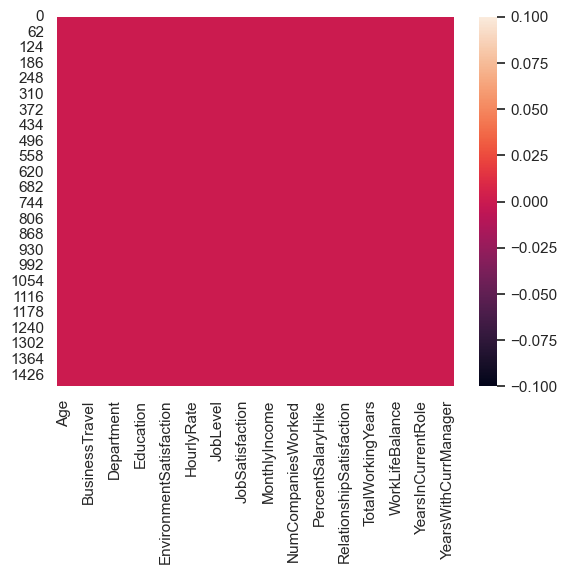

In [1201]:
sns.heatmap(df.isnull())

Here we can see that no null values are present in the dataset.

# Checking for duplicate values in the dataset-

In [1202]:
df.duplicated().value_counts()

False    1470
dtype: int64

In [1203]:
df.duplicated().sum()

0

Here we can see that there are no duplicated values present in the data set.

# Checking unique values in the each columns-

In [1204]:
df.nunique().to_frame('no of unique values')

,no of unique values
Age,43
Attrition,2
BusinessTravel,3
DailyRate,886
Department,3
DistanceFromHome,29
Education,5
EducationField,6
EnvironmentSatisfaction,4
Gender,2


# Lets check the value count of each column-

In [1205]:
for i in df.columns:
    print(df[i].value_counts())
    print('\n')

35    78
34    77
36    69
31    69
29    68
32    61
30    60
33    58
38    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
44    33
46    33
43    32
50    30
25    26
24    26
49    24
47    24
55    22
51    19
53    19
48    19
54    18
52    18
22    16
56    14
23    14
58    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: Age, dtype: int64


No     1233
Yes     237
Name: Attrition, dtype: int64


Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


691     6
408     5
530     5
1329    5
1082    5
       ..
650     1
279     1
316     1
314     1
628     1
Name: DailyRate, Length: 886, dtype: int64


Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


2     211
1     208
10     86
9      85
3      84
7      84
8      80
5      65
4      64
6      59
16     32
11     29
24     28
23     2

In [1206]:
np.average(df['PercentSalaryHike'])

15.209523809523809

Average % salary hike for the company is just 15.20% which can also be a reason for the attrition of employees.

In [1207]:
np.average(df['TotalWorkingYears'])

11.279591836734694

The average working years of experiance of the employees is almost 12 years which means there are many employees which working since long time in the same company.

# Analysis of target variable-

In [1208]:
df['Attrition'].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

There exist the class imbalance problem in the target variable which we will resolve moving further for model building.

# Statistical analysis-

In [1209]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,...,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,...,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


# Observations-

1. There are no missing values in the dataset as the count of the values for each column is equal.
2. Ditsnace from home, Monthly income,total working years and years with current manager, years at company, years at current role having mean is greater than median which means data is right skewed in these features.
3. There is huge difference bw 75% and maximum value in features like distance from home,age,monthly income,total working years,years at company,years in current role,years since last promotion & years with current manager which means these columns may have outliers which can impact our model performance.

# Correlation matrix-

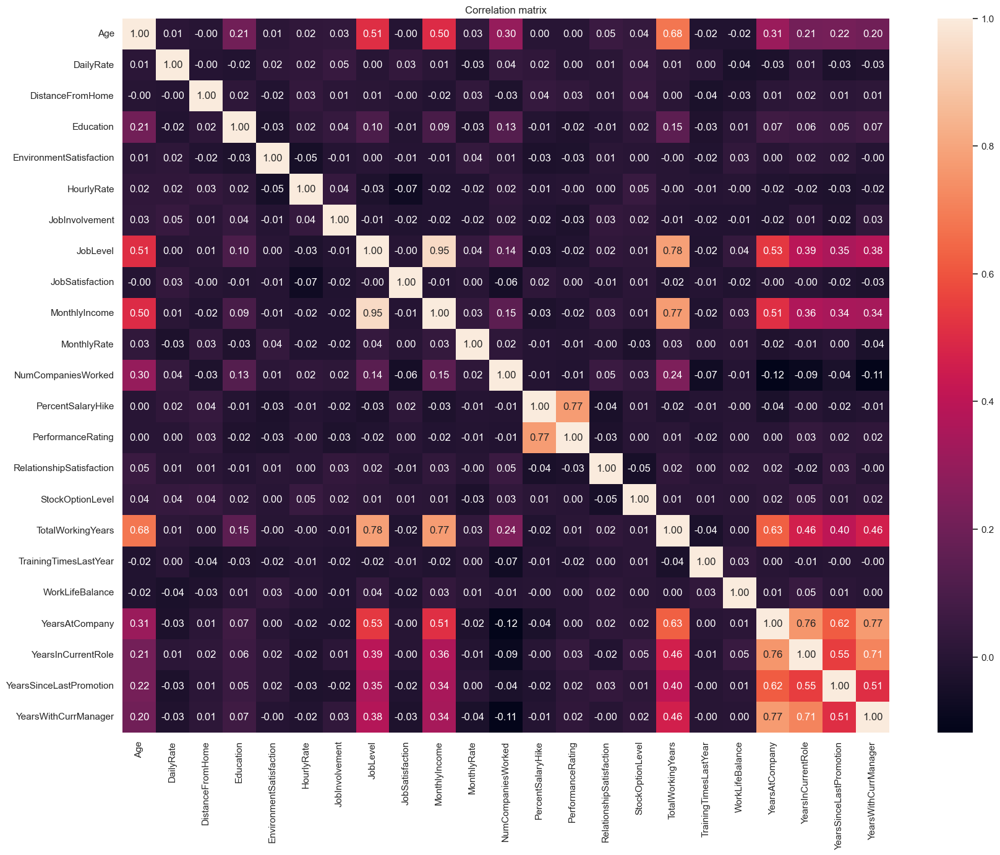

In [1210]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(),annot=True,fmt='.2f',annot_kws={'size':12})
plt.title('Correlation matrix')
plt.show()

# Conclusion-

The good thing is we cant see any multicollinearity among features. Generally features has multicollinearity if they have 90% correlationship.although-

1. Job level & total working years has 78% correlationship which can be considered as a good correlationship.
2. Performance rating & salary hike hike also has 77% correlationship.

# EDA-Exploratory data analysis-

# 1. Attrition analysis-

([<matplotlib.patches.Wedge at 0x107daba1a90>,
 [Text(-0.9706361429742902, 0.5384844268425907, 'No'),
  Text(0.9706361429742901, -0.5384844268425907, 'Yes')],
 [Text(-0.5334126551480333, 0.295923874210793, '83.88'),
  Text(0.5334126551480333, -0.2959238742107931, '16.12')])

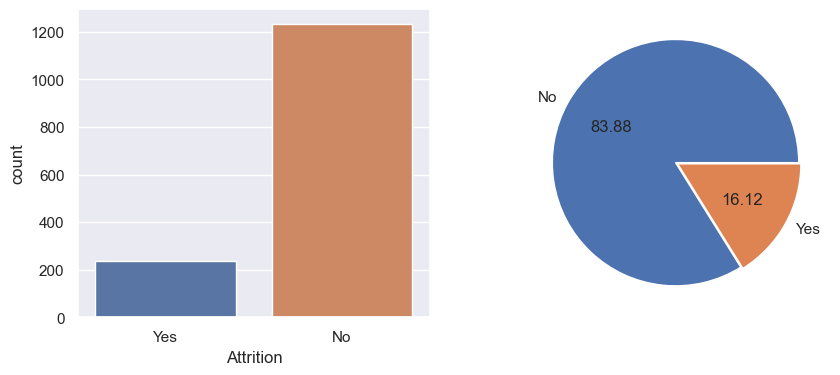

In [1211]:
sns.set_theme(style="darkgrid")
fig,axs=plt.subplots(1,2,figsize=(10,4))
sns.countplot(df['Attrition'],ax=axs[0])
plt.pie(x=df['Attrition'].value_counts().values,labels=df['Attrition'].value_counts().index,autopct='%.2f',explode=[0.01,0.01])

In this data set the attrition rate of the employee  is 16.12% and further we will be analysing the key factors which are impacting this attrition rate of employee in an organization.

In [1212]:
df['BusinessTravel'].value_counts()

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64

([<matplotlib.patches.Wedge at 0x1078e586910>,
 [Text(-0.6790139375666576, 0.8780888751090196, 'Travel_Rarely'),
  Text(0.3677290230250709, -1.0473181778356695, 'Travel_Frequently'),
  Text(1.0534518589650603, -0.3497701828959393, 'Non-Travel')],
 [Text(-0.3731518035276226, 0.4825533457806323, '70.95'),
  Text(0.20208531895972362, -0.5755532328646471, '18.84'),
  Text(0.5789239945663844, -0.192216046456327, '10.20')])

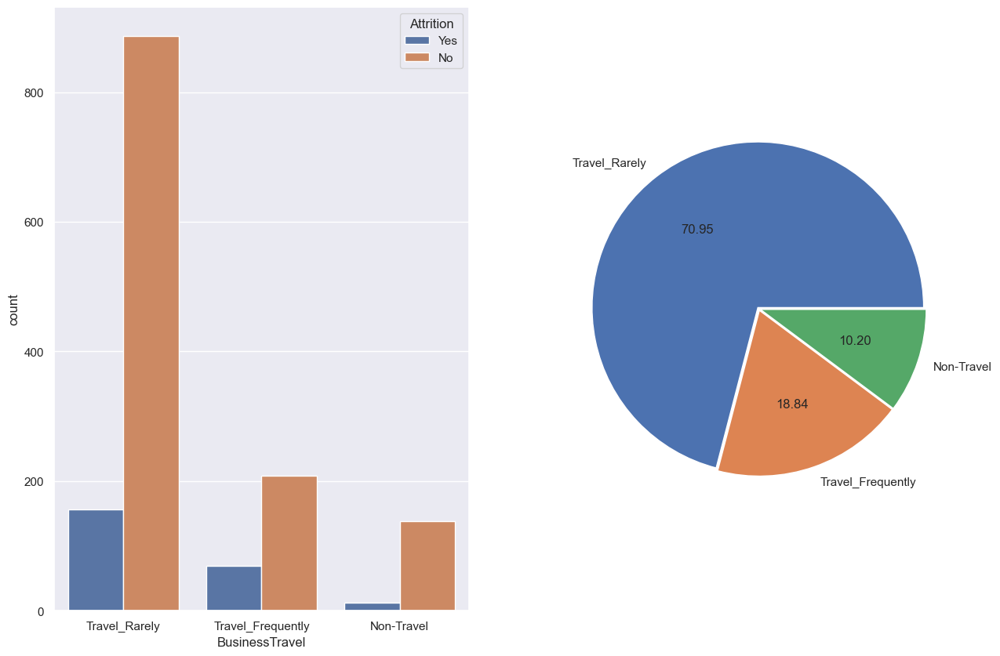

In [1213]:
sns.set_theme(style="darkgrid")
fig,axs=plt.subplots(1,2,figsize=(15,10))
My_plot=sns.countplot(df['BusinessTravel'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['BusinessTravel'].value_counts().values,labels=df['BusinessTravel'].value_counts().index,autopct='%.2f',explode=[0.01,0.01,0.01])

# Observation-
Here we can see that the employee who travel very rarely has very less attrition rate on the other hand the employee travel frequently has higher attrition rate.         
This may be a key factor for the organizations to to look on as people who travel frequently may result into leaving the organization may be for the sake of spending more time with the family 

# Analysis of how age of employee effects attrition-

In [417]:
df1=df.groupby(['Age','Attrition']).apply(lambda x:x['Attrition'].count()).reset_index(name='Counts')
df1

,Age,Attrition,Counts
0,18,No,4
1,18,Yes,4
2,19,No,3
3,19,Yes,6
4,20,No,5
...,...,...,...
77,57,No,4
78,58,No,9
79,58,Yes,5
80,59,No,10


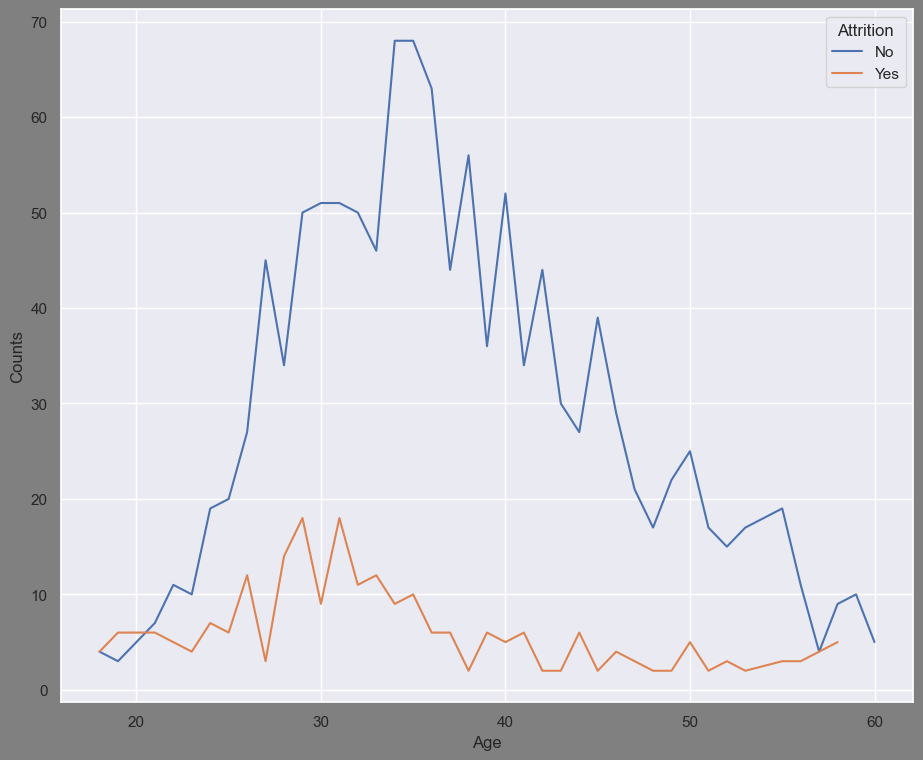

In [418]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(11,9),facecolor='grey')
sns.lineplot(x='Age',y='Counts',hue='Attrition',data=df1)
plt.show()

# Observation-
Here we can see that in between the age of 28 years to 32 years we can see a gradual spike in the counts of employee leaving company which may be due to in the initial years of the working employee are looking for the changing organizations may be for the sake of getting high perks and pramotions.     
On the other hand we can witness the gradual declination in the attrition rate after 35 years age which may be due to after a certain age employee start looking for the settlements in the career.

# Analysis of departement vs Attrition-

In [419]:
df['Department'].value_counts()

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64

In [420]:
df1=df.groupby(['Department','Attrition']).apply(lambda x:x['Attrition'].count()).reset_index(name='Counts')
df1

,Department,Attrition,Counts
0,Human Resources,No,51
1,Human Resources,Yes,12
2,Research & Development,No,828
3,Research & Development,Yes,133
4,Sales,No,354
5,Sales,Yes,92


([<matplotlib.patches.Wedge at 0x107d30b5a30>,
 [Text(-0.5155194847772882, 0.9830257681337552, 'Research & Development'),
  Text(0.3788990620766373, -1.0433290472125487, 'Sales'),
  Text(1.0999542106013445, -0.1489991093274497, 'Human Resources')],
 [Text(-0.2833035006433745, 0.5402213680735051, '65.37'),
  Text(0.20822380888896283, -0.5733610079276167, '30.34'),
  Text(0.6044793409610991, -0.08188239341418406, '4.29')])

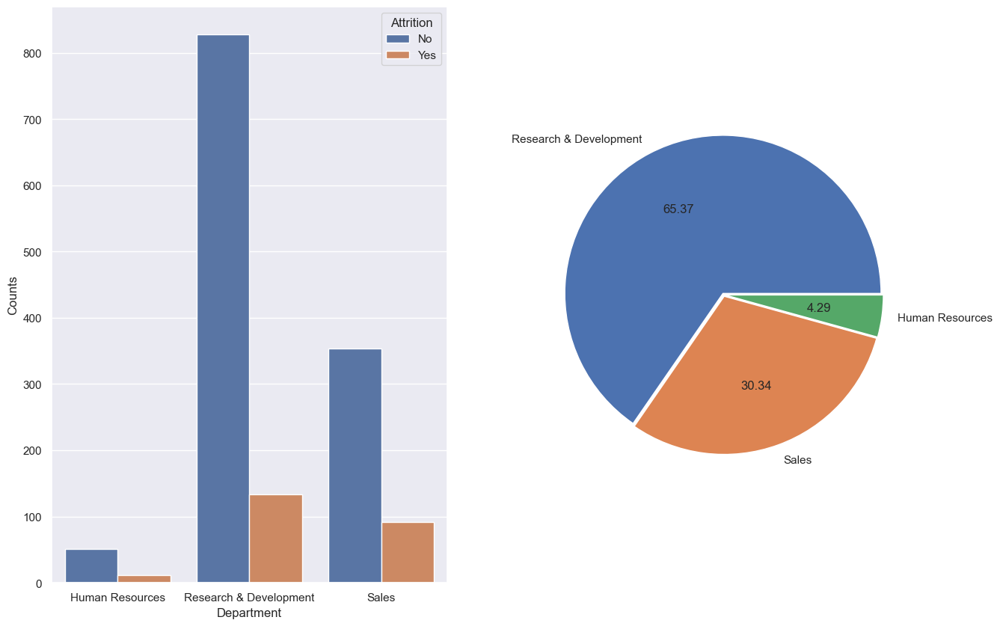

In [421]:
sns.set_theme(style="darkgrid")
fig,axs=plt.subplots(1,2,figsize=(15,10))
sns.barplot(x='Department',y='Counts',hue='Attrition',data=df1,ax=axs[0])
plt.pie(x=df['Department'].value_counts().values,labels=df['Department'].value_counts().index,explode=[.01,.01,.01],autopct='%.2f')

# Observations-

This data comprises of only 3 major departments- among which Sales department has the highest attrition rates (25.84%), followed by the Human Resource Department (19.05%). Research and Development has the least attrition rates, that suggests the stability and content of the department as can be seen from the chart above(13.83%).

# Key take aways-

We also visulaize our data through the same graph in which departement we are getting much of the resigns and we may start focusing on the reasons behind those resign.
We may come up with a lot of improvements the required area to increase the productivity.

# Analysis of years since last pramotion vs Attrition-

In [422]:
df1=df.groupby(['YearsSinceLastPromotion','Attrition']).apply(lambda x:x['Attrition'].count()).reset_index(name='Counts')
df1

,YearsSinceLastPromotion,Attrition,Counts
0,0,No,471
1,0,Yes,110
2,1,No,308
3,1,Yes,49
4,2,No,132
5,2,Yes,27
6,3,No,43
7,3,Yes,9
8,4,No,56
9,4,Yes,5


<AxesSubplot:xlabel='YearsSinceLastPromotion', ylabel='count'>

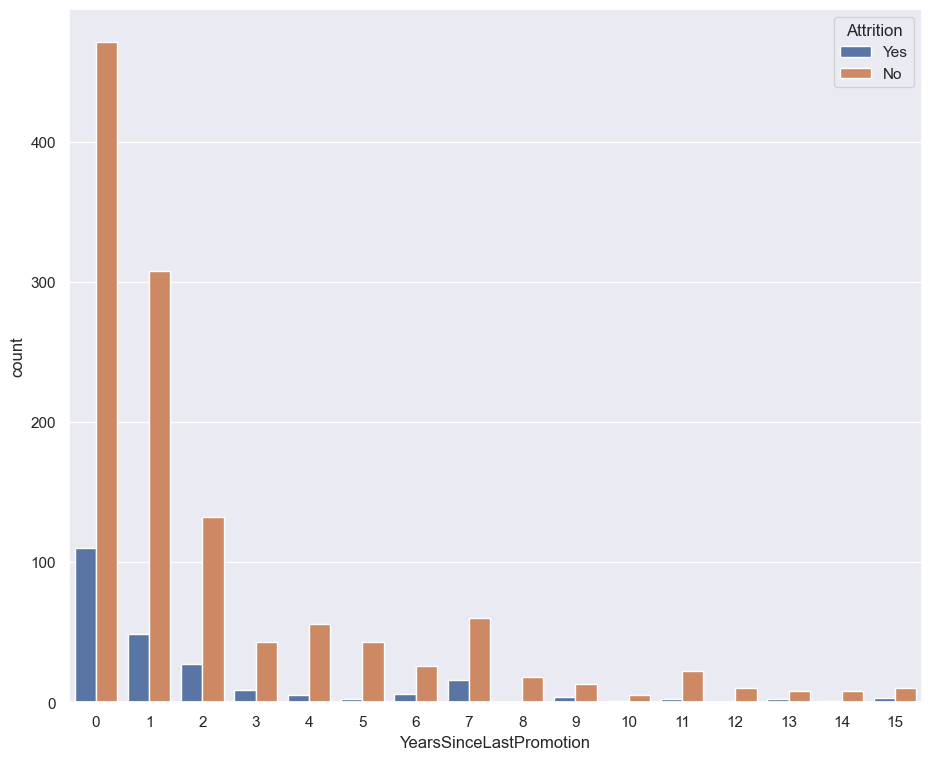

In [423]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(11,9))
sns.countplot(df['YearsSinceLastPromotion'],hue=df['Attrition'])

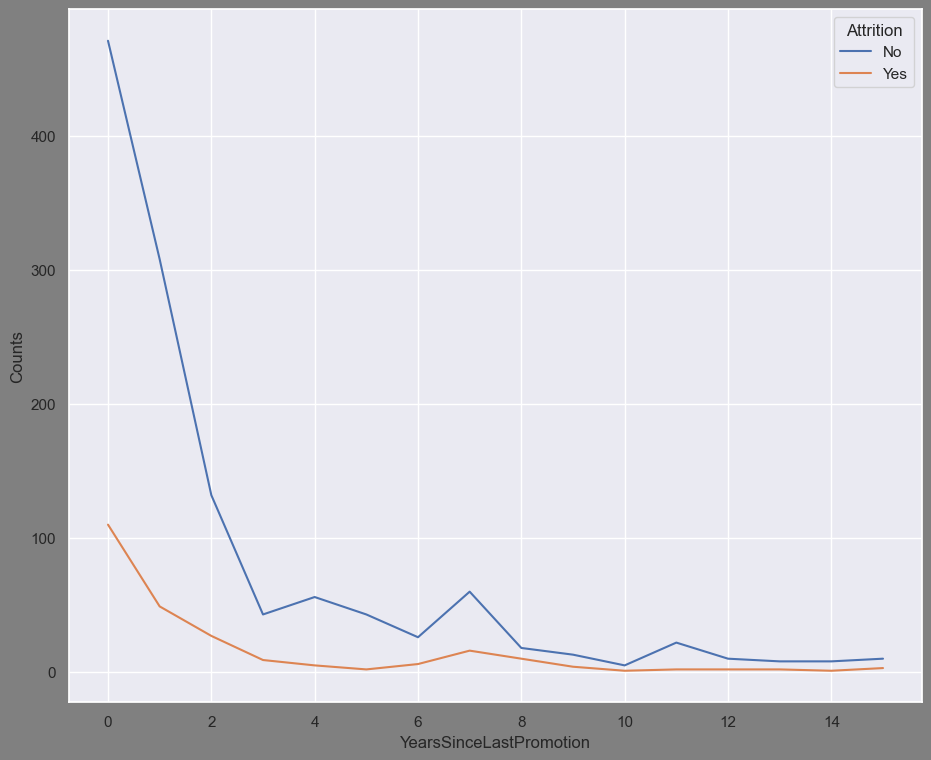

In [424]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(11,9),facecolor='grey')
sns.lineplot(x='YearsSinceLastPromotion',y='Counts',hue='Attrition',data=df1)
plt.show()

# Observations-

Here one thing we can notice is when employee getting pramotions on the time we can see that the attrition rate is very less while on the other hand at 7th year mark we can see how the attrition rate has got an spike which is clearly indication employee with the delay in the pramotions are more prone towards the attrition.

# Analysis of Years with current manager vs Attrition-

In [425]:
df1=df.groupby(['YearsWithCurrManager','Attrition']).apply(lambda x:x['Attrition'].count()).reset_index(name='Counts')
df1

,YearsWithCurrManager,Attrition,Counts
0,0,No,178
1,0,Yes,85
2,1,No,65
3,1,Yes,11
4,2,No,294
5,2,Yes,50
6,3,No,123
7,3,Yes,19
8,4,No,87
9,4,Yes,11


<AxesSubplot:xlabel='YearsWithCurrManager', ylabel='count'>

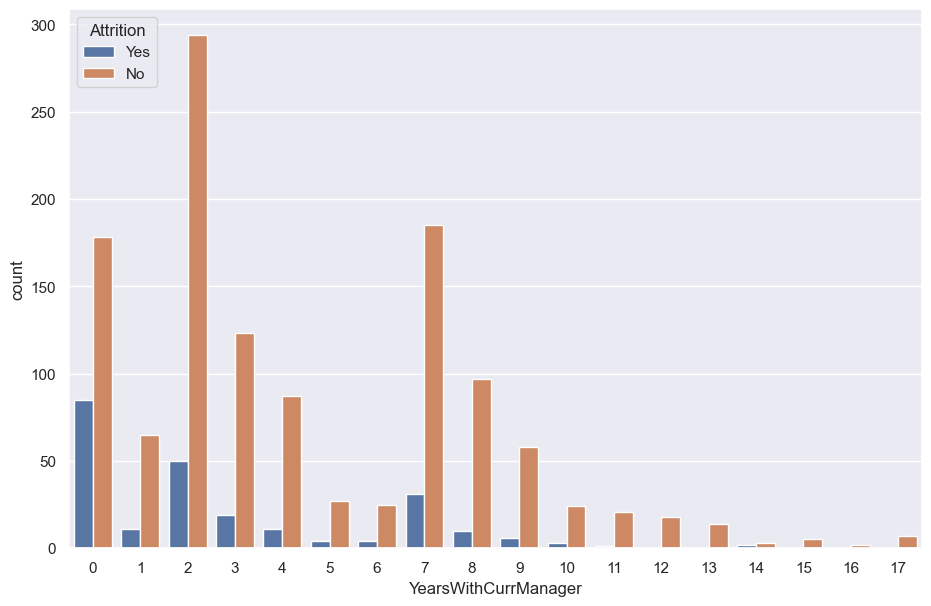

In [426]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(11,7))
sns.countplot(df['YearsWithCurrManager'],hue=df['Attrition'])

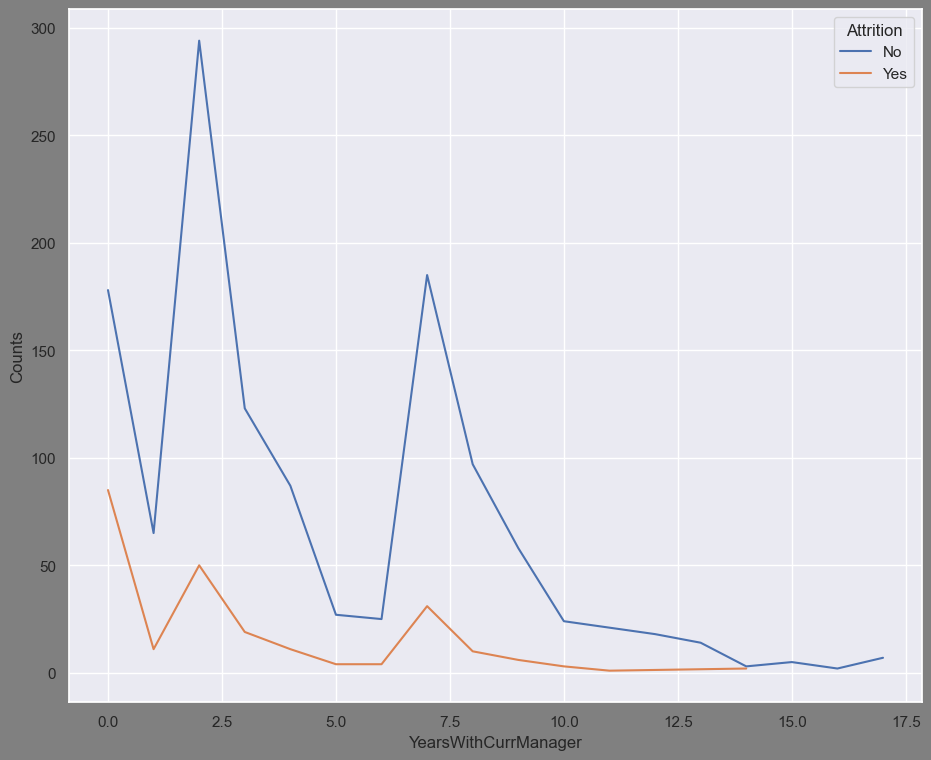

In [427]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(11,9),facecolor='grey')
sns.lineplot(x='YearsWithCurrManager',y='Counts',hue='Attrition',data=df1)
plt.show()

# Observations-

Here we can see that Employee in the initial years with the manager are more prone for attrition but as the time progresses we can notice a good decline in the attrition which is clearly indicating that it may in the initial years with the managers they are facing few problems but as they get settle with time the attrition rate also get decreases.

# Analysis of Environment-satisfaction with Attrition-

([<matplotlib.patches.Wedge at 0x107d30e2cd0>,
 [Text(0.6291996143131388, 0.9144440088645107, '3'),
  Text(-1.0748909114190726, 0.27696485074585847, '4'),
  Text(-0.2815567081562372, -1.0736972665012348, '2'),
  Text(0.9117462490671664, -0.6331025014260747, '1')],
 [Text(0.34577636462253575, 0.5025322931597761, '30.82'),
  Text(-0.5907058161852561, 0.15220590896844471, '30.34'),
  Text(-0.1547293621399141, -0.5900498491583361, '19.52'),
  Text(0.5010497404783526, -0.34792119447739234, '19.32')])

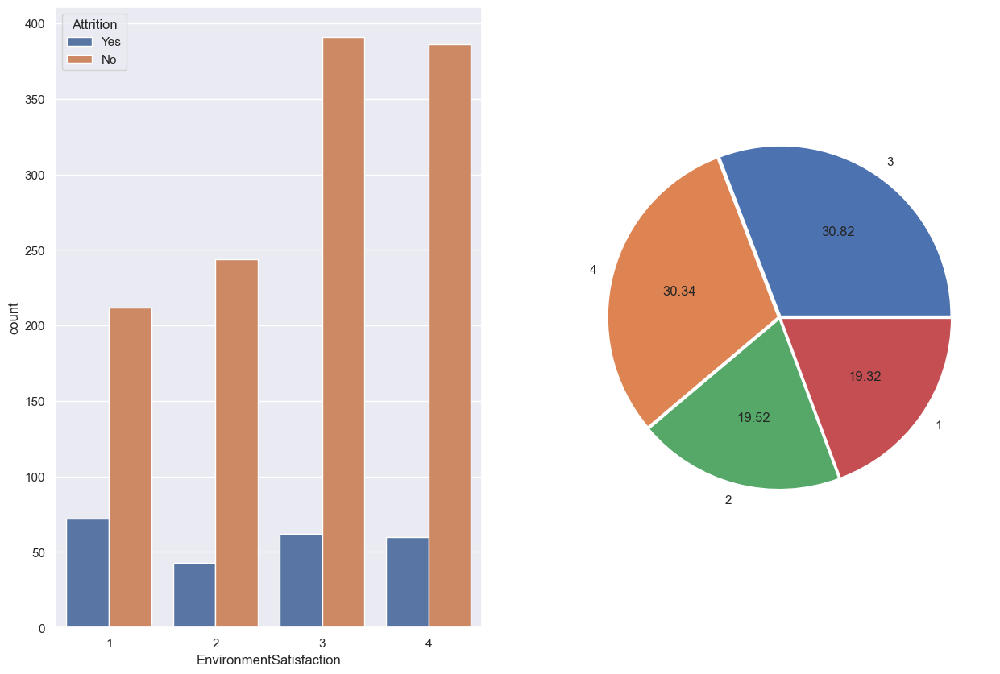

In [428]:
sns.set_theme(style="darkgrid")
fig,axs=plt.subplots(1,2,figsize=(15,10))
sns.countplot(df['EnvironmentSatisfaction'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['EnvironmentSatisfaction'].value_counts().values,labels=df['EnvironmentSatisfaction'].value_counts().index,explode=[.01,.01,.01,.01],autopct='%.2f')

# Observations-

Here we may notice as the working environment is improving in the scale of 1 to 4 the employee attrition is also decreasing.

# Key takeaways-

We as an organization may come up with certain policies which creates a better environment for the employee so that we always keep a check on the attrition rate in our organization which will result better productivity.

# Analysis of how Gender is impacting employee attrition-

([<matplotlib.patches.Wedge at 0x107d316aeb0>,
 [Text(-0.34300894282756234, 1.0556727073957715, 'Male'),
  Text(0.343009041666773, -1.055672675280952, 'Female')],
 [Text(-0.18850041002235404, 0.5801444608210995, '60.00'),
  Text(0.18850046433939777, -0.580144443172415, '40.00')])

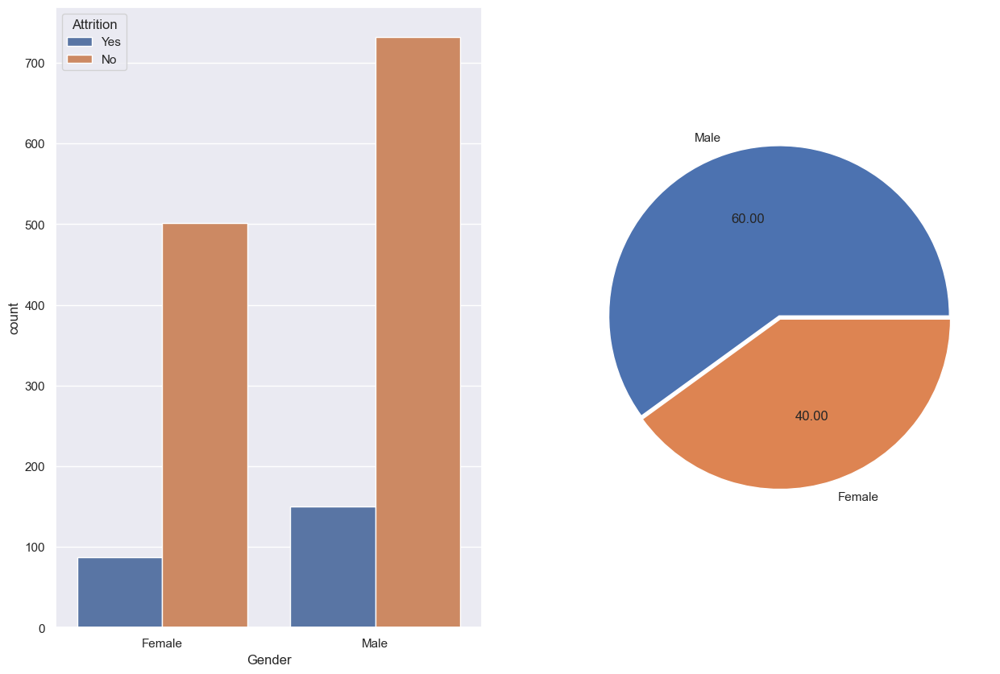

In [429]:
sns.set_theme(style="darkgrid")
fig,axs=plt.subplots(1,2,figsize=(15,10))
sns.countplot(df['Gender'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['Gender'].value_counts().values,labels=df['Gender'].value_counts().index,explode=[.01,.01],autopct='%.2f')

# Observations-

Here we may notice one thing very clearly Male employees have high attrition rates than the female employees which is also a key take away for us 

# Analysis of how job satisfaction is impacting the employee attrition-

([<matplotlib.patches.Wedge at 0x2334c225100>,
 [Text(0.6174224392093188, 0.9224367358040416, '4'),
  Text(-1.0794689004053273, 0.25854766109503635, '3'),
  Text(-0.2677659893906803, -1.077219278942607, '1'),
  Text(0.9171250325212978, -0.6252852746729356, '2')],
 [Text(0.3393042233492653, 0.5069246926490678, '31.22'),
  Text(-0.593221647970495, 0.14208475069186682, '30.07'),
  Text(-0.14715067885433783, -0.5919853695090002, '19.66'),
  Text(0.5040056485026951, -0.3436252410364781, '19.05')])

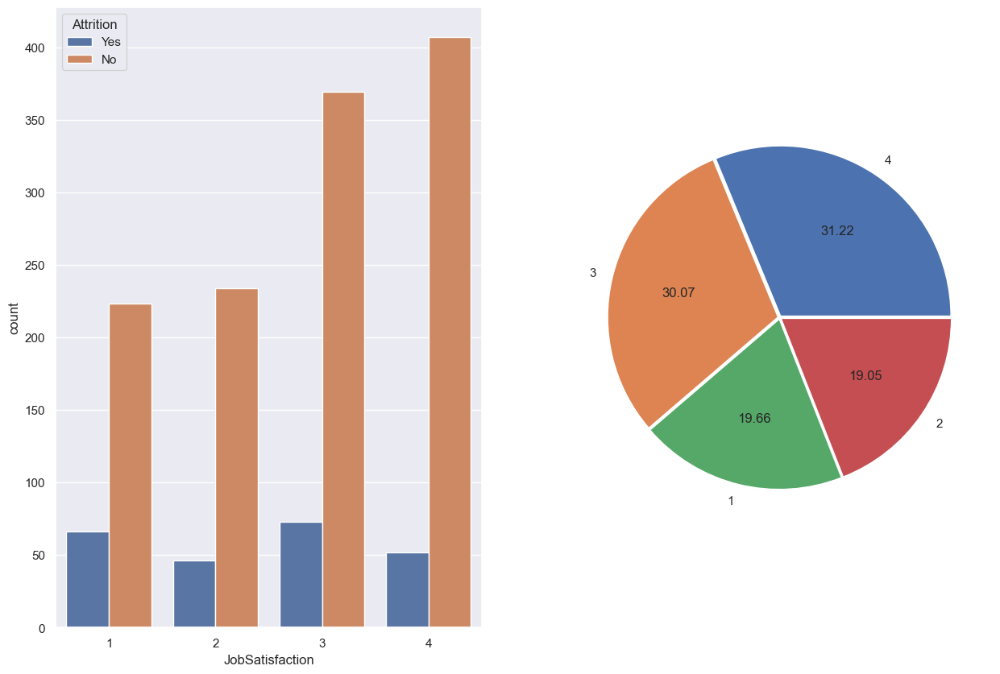

In [120]:
sns.set_theme(style="darkgrid")
fig,axs=plt.subplots(1,2,figsize=(15,10))
sns.countplot(df['JobSatisfaction'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['JobSatisfaction'].value_counts().values,labels=df['JobSatisfaction'].value_counts().index,explode=[.01,.01,.01,.01],autopct='%.2f')

# Observations-

Here we can notice one thing very clearly is that as the job satisfaction is increasing the attrition rates decreasing which is a point to be noted.

# Key takeaway-

We as an organization may have time to time meeting or surveys with employees discussing about the roles or advancements they want to have or what further responsibilty they want to take which in result will improve the employee job satifaction and we can address the issue of employee attrition and increase our productivity.

# Analysis of how Education field is impacting the employee attrition-

[Text(0, 0, 'Life Sciences'),
 Text(1, 0, 'Other'),
 Text(2, 0, 'Medical'),
 Text(3, 0, 'Marketing'),
 Text(4, 0, 'Technical Degree'),
 Text(5, 0, 'Human Resources')]

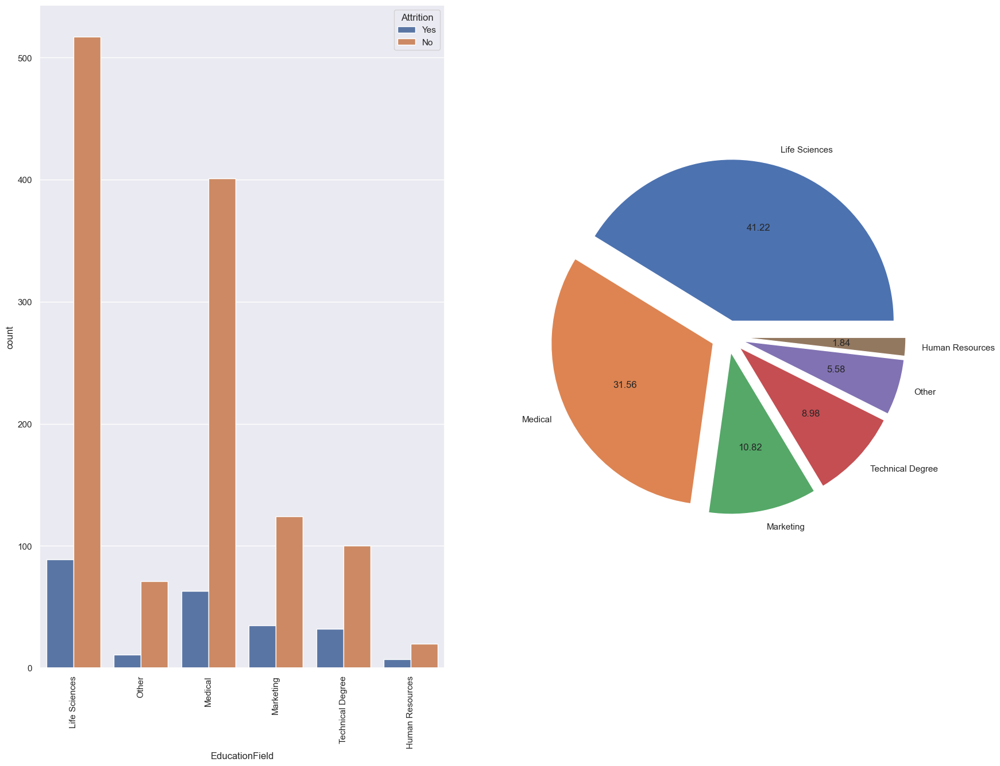

In [121]:
sns.set_theme(style="darkgrid")
fig,axs=plt.subplots(1,2,figsize=(20, 15))
my_plot=sns.countplot(df['EducationField'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['EducationField'].value_counts().values,labels=df['EducationField'].value_counts().index,explode=[.1,.1,.1,.1,.1,.1],autopct='%.2f')
my_plot.set_xticklabels(my_plot.get_xticklabels(), rotation=90)

# Observations-

Here we can notice that Life science field has the highest attrition rate which we can make a point to address

# Analysis of how job role is impacting the employee attrition-

[Text(0, 0, 'Sales Executive'),
 Text(1, 0, 'Research Scientist'),
 Text(2, 0, 'Laboratory Technician'),
 Text(3, 0, 'Manufacturing Director'),
 Text(4, 0, 'Healthcare Representative'),
 Text(5, 0, 'Manager'),
 Text(6, 0, 'Sales Representative'),
 Text(7, 0, 'Research Director'),
 Text(8, 0, 'Human Resources')]

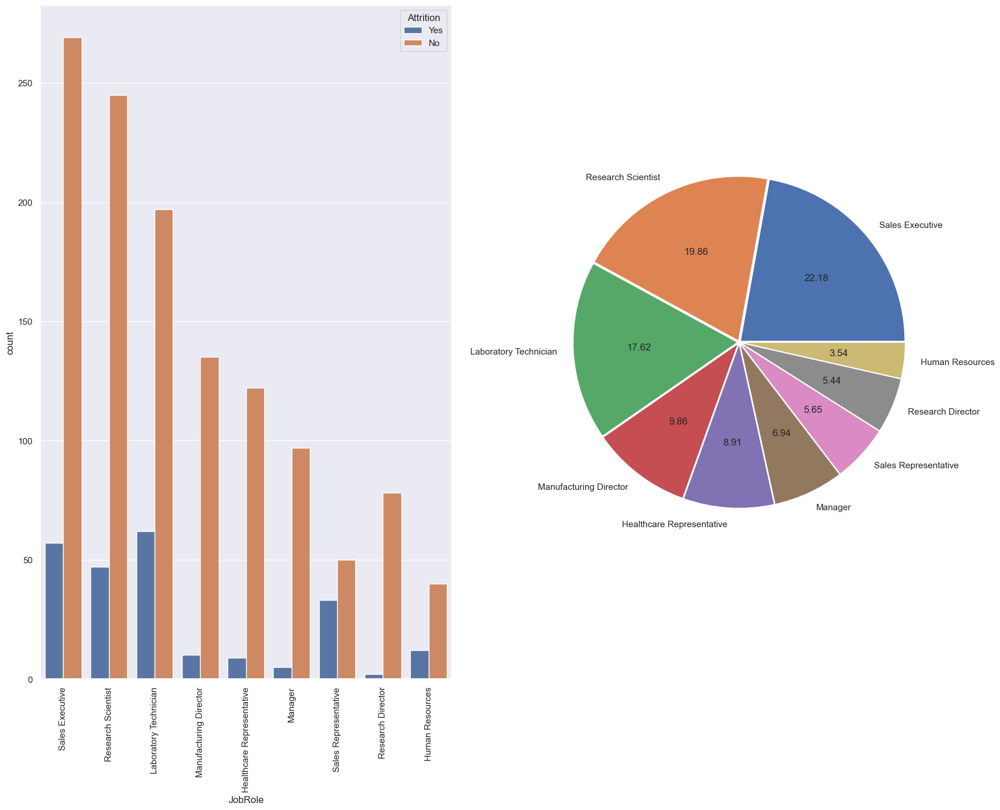

In [122]:
sns.set_theme(style="darkgrid")
fig,axs=plt.subplots(1,2,figsize=(20, 15))
my_plot=sns.countplot(df['JobRole'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['JobRole'].value_counts().values,labels=df['JobRole'].value_counts().index,explode=[.01,.01,.01,.01,.01,.01,.01,.01,.01],autopct='%.2f')
my_plot.set_xticklabels(my_plot.get_xticklabels(), rotation=90)

# Observations-

Here we can notice that sales executives have the highest attrition rate which may be due to the extra pressures of sales they are facing.

# Analysis of how employee marital status effects Attrition rate-

[Text(0, 0, 'Single'), Text(1, 0, 'Married'), Text(2, 0, 'Divorced')]

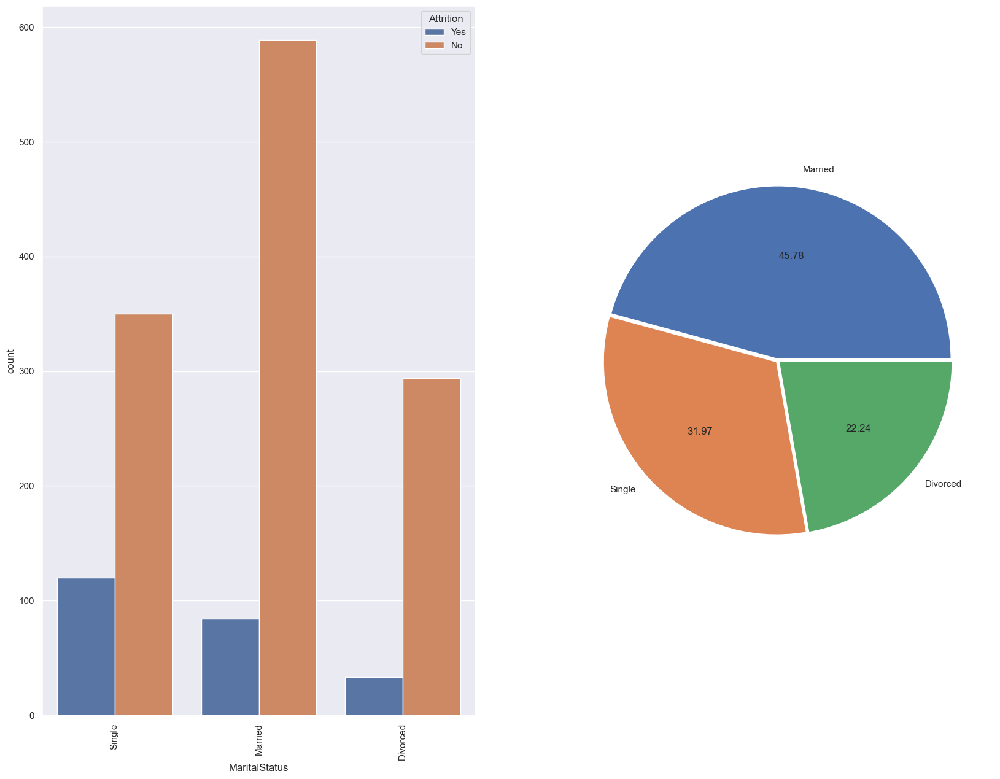

In [123]:
sns.set_theme(style="darkgrid")
fig,axs=plt.subplots(1,2,figsize=(20, 15))
my_plot=sns.countplot(df['MaritalStatus'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['MaritalStatus'].value_counts().values,labels=df['MaritalStatus'].value_counts().index,explode=[.01,.01,.01],autopct='%.2f')
my_plot.set_xticklabels(my_plot.get_xticklabels(), rotation=90)

# Observations-

Here we can see that single employee has the highest attrition on the other hand married employee has the lowest attrition rate.

# Analysis of how employee monthly income effects Attrition rate-

In [124]:
df1=df.groupby(['MonthlyIncome','Attrition']).apply(lambda x:x['Attrition'].count()).reset_index(name='Count')
df1

,MonthlyIncome,Attrition,Count
0,1009,Yes,1
1,1051,No,1
2,1052,No,1
3,1081,Yes,1
4,1091,Yes,1
...,...,...,...
1383,19859,Yes,1
1384,19926,No,1
1385,19943,No,1
1386,19973,No,1


<AxesSubplot:xlabel='MonthlyIncome', ylabel='Count'>

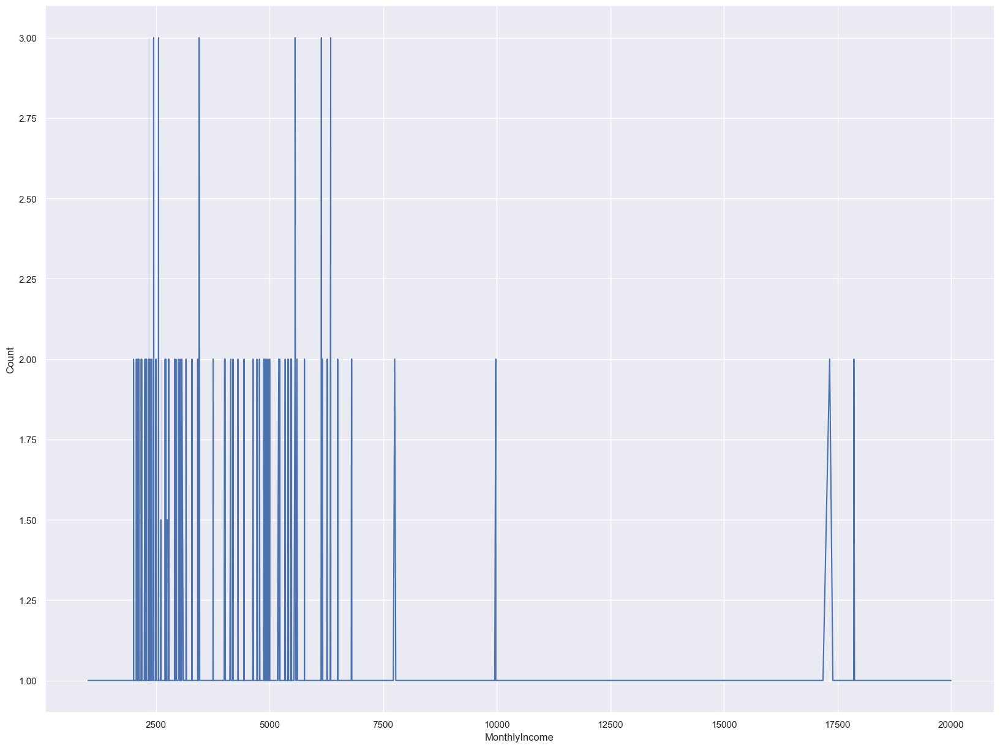

In [125]:
plt.figure(figsize=(20,15))
sns.lineplot(x='MonthlyIncome',y='Count',data=df1)

# Observation-

Here we can notice employee with less monthly incomes are more prone towards the attrition which is there due to less income they are looking for the other oportunities which may help them to get better monthly income.

# Key takeaway-

Employee who are not harmonic with whatever income they are getting are more prone towards leaving the job.

# Analysis of how No of previous companies of employee effects Attrition rate-

In [126]:
df['NumCompaniesWorked'].value_counts()

1    521
0    197
3    159
2    146
4    139
7     74
6     70
5     63
9     52
8     49
Name: NumCompaniesWorked, dtype: int64

([<matplotlib.patches.Wedge at 0x233463f67c0>,
 [Text(0.4901424580672805, 0.9959218698270283, '1'),
  Text(-0.977461031215083, 0.5259942323409513, '0'),
  Text(-1.070627430835885, -0.2930134883273336, '3'),
  Text(-0.6733702651426848, -0.88242420978896, '2'),
  Text(-0.04743002742019972, -1.1089862003194264, '4'),
  Text(0.44496701851113907, -1.0169092154353345, '7'),
  Text(0.7320967524234212, -0.8343466576256419, '6'),
  Text(0.9366952058895203, -0.595568712461954, '5'),
  Text(1.053451875338983, -0.34977013358029885, '9'),
  Text(1.1039193032250971, -0.1160266002562179, '8')],
 [Text(0.26935756704598296, 0.5473084149499885, '35.44'),
  Text(-0.537163269406487, 0.28905989344863087, '13.40'),
  Text(-0.5883628223512521, -0.16102543052222837, '10.82'),
  Text(-0.37005032588922315, -0.48493582700114013, '9.93'),
  Text(-0.026065150203893536, -0.6094428668422074, '9.46'),
  Text(0.24453142458720253, -0.558842001275274, '5.03'),
  Text(0.4023234405209792, -0.4585148298663436, '4.76'),
  T

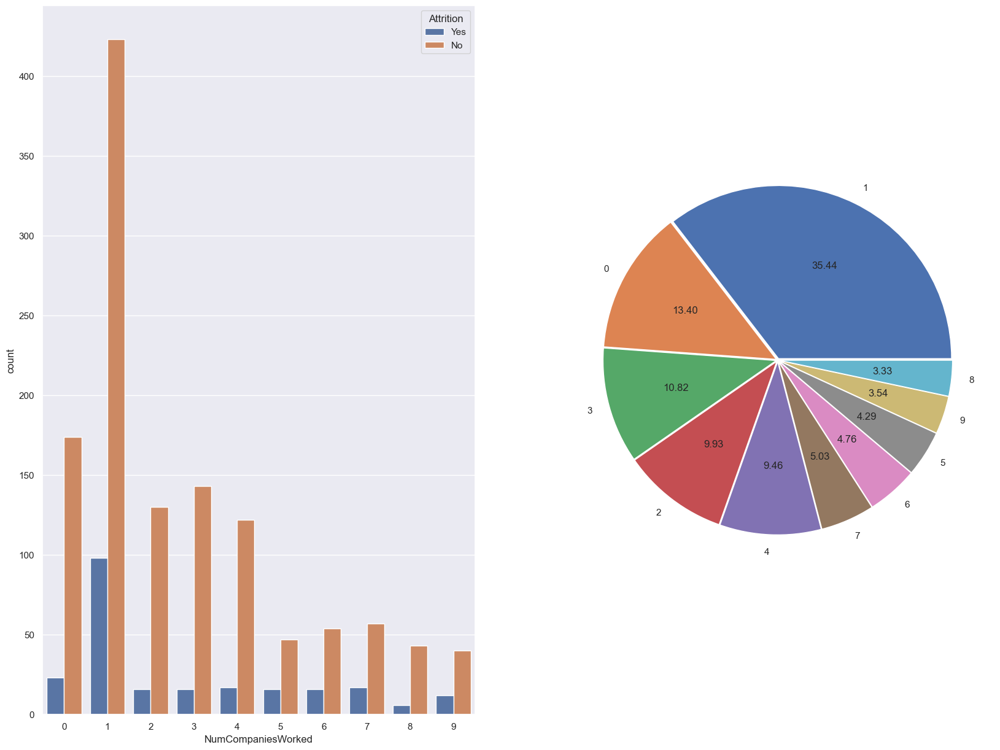

In [127]:
fig,axs=plt.subplots(1,2,figsize=(20, 15))
sns.countplot(df['NumCompaniesWorked'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['NumCompaniesWorked'].value_counts().values,labels=df['NumCompaniesWorked'].value_counts().index,explode=[.01,.01,.01,.01,.01,.01,.01,.01,.01,.01],autopct='%.2f')

# Observations-

Here we can see that employees with less no of companies worked with before joing the current organization are having the high attrition rate.

# Key takeaway-

Once an employee has already changed a lot of companies have less chances of leaving the current organization.

# Analysis of how % salary hike effects Attrition rate-

([<matplotlib.patches.Wedge at 0x2334b850370>,
 [Text(1.0000754337091842, 0.4816109704848796, '11'),
  Text(0.24931038823445312, 1.0816396490136566, '13'),
  Text(-0.6714828785647278, 0.8838612695408862, '14'),
  Text(-1.107405291305814, 0.0758519662756705, '12'),
  Text(-0.934141041496365, -0.5995669392086981, '15'),
  Text(-0.6213595221014707, -0.919789293422049, '18'),
  Text(-0.2516214535342715, -1.0811043631959407, '17'),
  Text(0.12545916178127575, -1.1028871196659882, '16'),
  Text(0.475189212301855, -1.0031426680746578, '19'),
  Text(0.7356563176591566, -0.8312098304809503, '22'),
  Text(0.9103912161019283, -0.6350494733833357, '20'),
  Text(1.0270877783587087, -0.4209402517533482, '21'),
  Text(1.0816396446370085, -0.2493104072226559, '23'),
  Text(1.1017743435755054, -0.1348825260690377, '24'),
  Text(1.1091787994281217, -0.04268947058925845, '25')],
 [Text(0.5495910041104524, 0.26466909188808696, '14.29'),
  Text(0.137008411552267, 0.5944145818903879, '14.22'),
  Text(-0.369

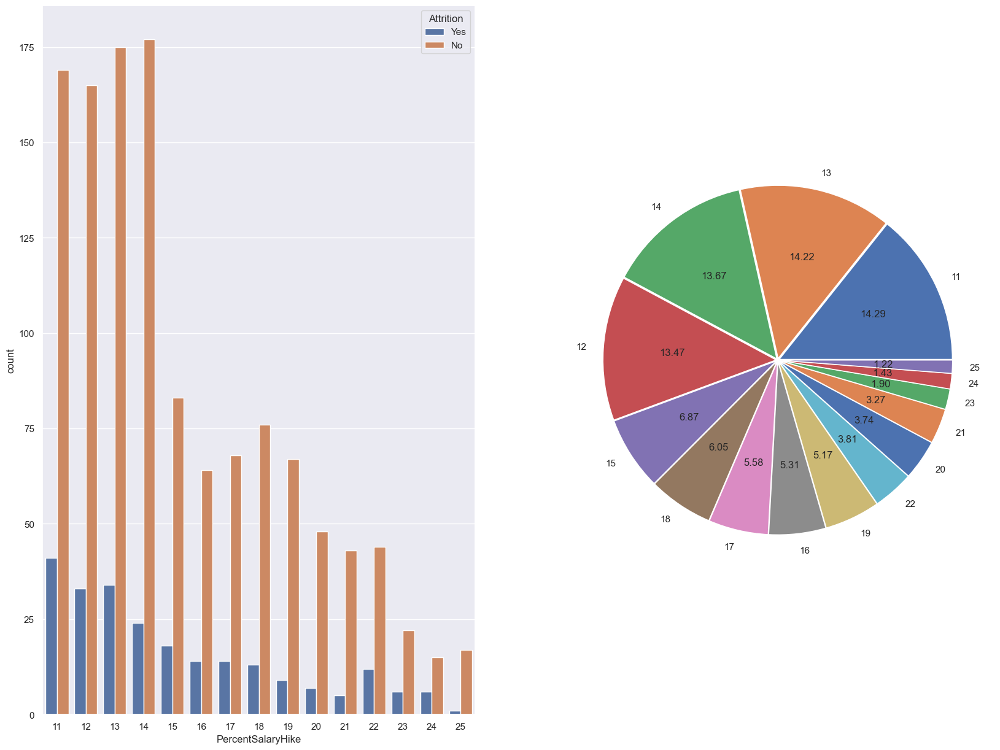

In [128]:
fig,axs=plt.subplots(1,2,figsize=(20, 15))
sns.countplot(df['PercentSalaryHike'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['PercentSalaryHike'].value_counts().values,labels=df['PercentSalaryHike'].value_counts().index,explode=[.01,.01,.01,.01,.01,.01,.01,.01,.01,.01,.01,.01,.01,.01,.01],autopct='%.2f')

# Observations-

Here we can notice that employees getting good percentage of salary hike are having less attrition rate.

# Analysis of how Years In Current Role effects Attrition rate-

<AxesSubplot:xlabel='YearsInCurrentRole', ylabel='count'>

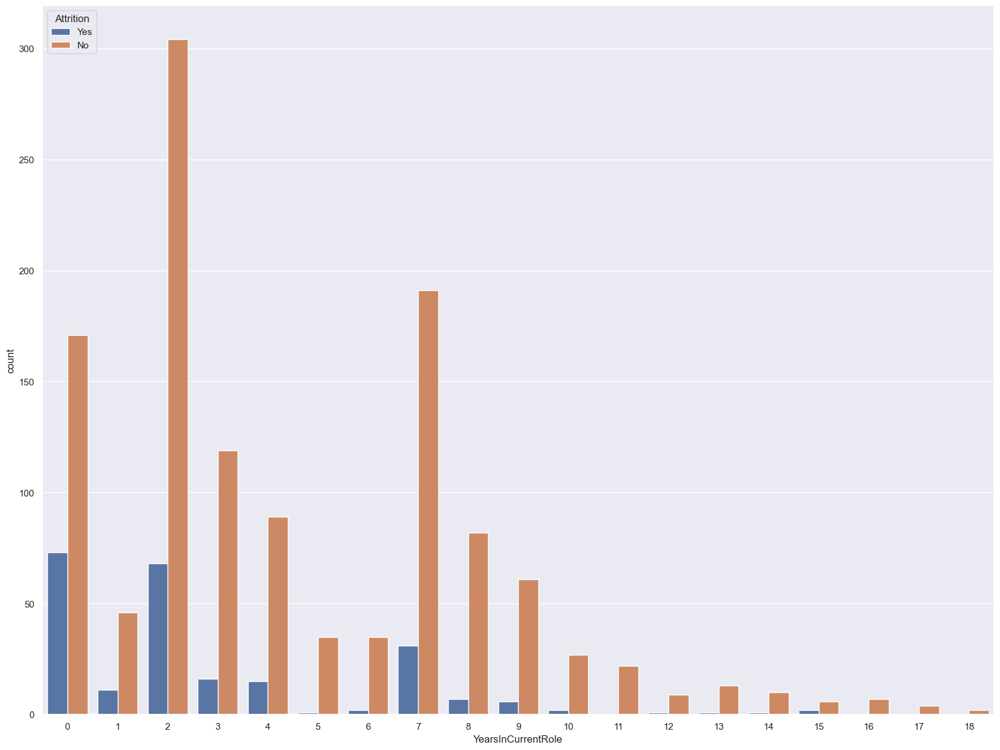

In [129]:
fig,axs=plt.subplots(1,1,figsize=(20, 15))
sns.countplot(df['YearsInCurrentRole'],hue=df['Attrition'])

# Observations-

Here we may notice is that employee in the initial years of current role has the high attrition rate which may be due to that they are not use to of the role but as the get settle with the attrition rate decreases.

# Analysis of how Job involvement effects Attrition rate-

([<matplotlib.patches.Wedge at 0x233412e9730>,
 [Text(-0.3112744838343362, 1.065461494242597, '3'),
  Text(-0.22149196185129297, -1.0876770250562737, '2'),
  Text(0.8751786364608648, -0.6827608324168146, '4'),
  Text(1.092582952610964, -0.19586345157764418, '1')],
 [Text(-0.17106075237742796, 0.5855238842234092, '59.05'),
  Text(-0.12172080786422405, -0.5977324191750691, '25.51'),
  Text(0.4809540254424572, -0.37521090790473594, '9.80'),
  Text(0.600428469452872, -0.10763667158771437, '5.65')])

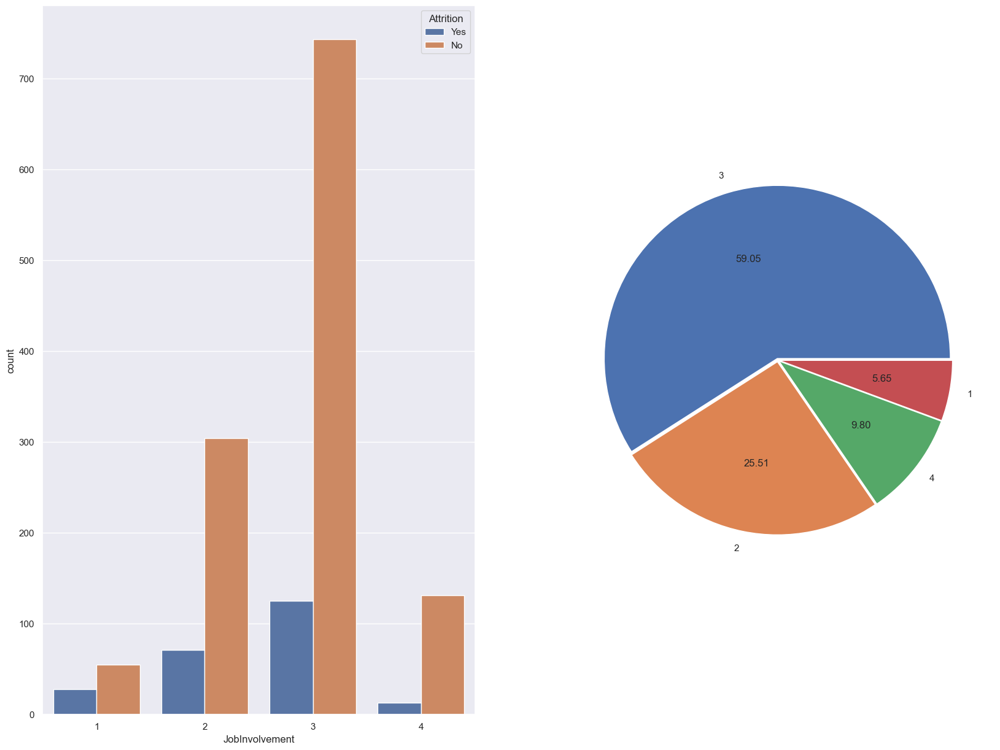

In [130]:
fig,axs=plt.subplots(1,2,figsize=(20, 15))
sns.countplot(df['JobInvolvement'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['JobInvolvement'].value_counts().values,labels=df['JobInvolvement'].value_counts().index,explode=[.01,.01,.01,.01],autopct='%.2f')

# Observations-

Here we can notice that as the employee job involvement increases the attrition rate decreases which is due to that they are enjoying by being in that job role.
so giving the employee job role which they enjoy doing, have less attrition rate.

# Analysis of how Employee overtime Attrition rate-

([<matplotlib.patches.Wedge at 0x23347dcf6d0>,
 [Text(-0.6994670164087009, 0.8618850810614548, 'No'),
  Text(0.6994670164087003, -0.8618850810614551, 'Yes')],
 [Text(-0.38439178379216893, 0.47364855806079936, '71.70'),
  Text(0.38439178379216865, -0.47364855806079964, '28.30')])

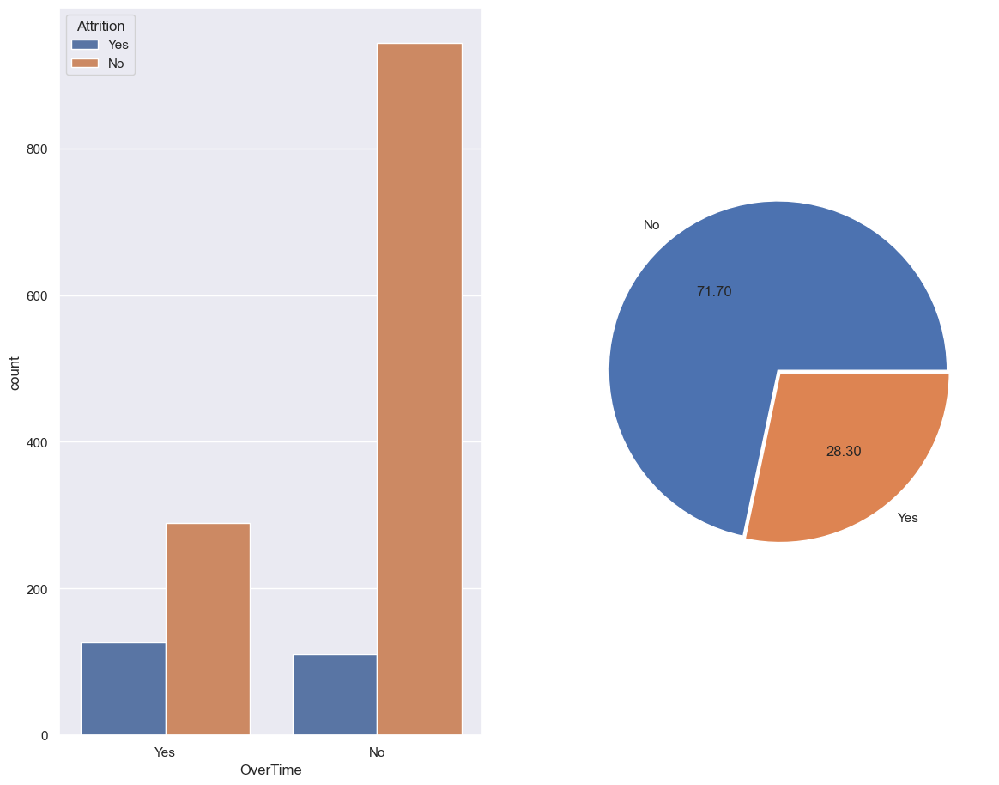

In [131]:
fig,axs=plt.subplots(1,2,figsize=(14,11))
sns.countplot(df['OverTime'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['OverTime'].value_counts().values,labels=df['OverTime'].value_counts().index,explode=[.01,.01],autopct='%.2f')

# Observations-

Employees doing overtime has highest attrition rate which may be due to the reason they are not able to spend good time with family and friends.
so worklife balance also impacts the employee attrition rate.

# Analysis of how Employee work life balance effects Attrition rate-

([<matplotlib.patches.Wedge at 0x2334b126250>,
 [Text(-0.36772902302507054, 1.0473181778356697, '3'),
  Text(-0.17715605622110103, -1.0957717516637242, '2'),
  Text(0.8707830029972112, -0.6883581638152911, '4'),
  Text(1.0938161890021745, -0.18885482434070727, '1')],
 [Text(-0.20208531895972345, 0.5755532328646472, '60.75'),
  Text(-0.09735603089628073, -0.6021808725359205, '23.40'),
  Text(0.47853840705252143, -0.3782869188534483, '10.41'),
  Text(0.60110619395615, -0.10378508364669499, '5.44')])

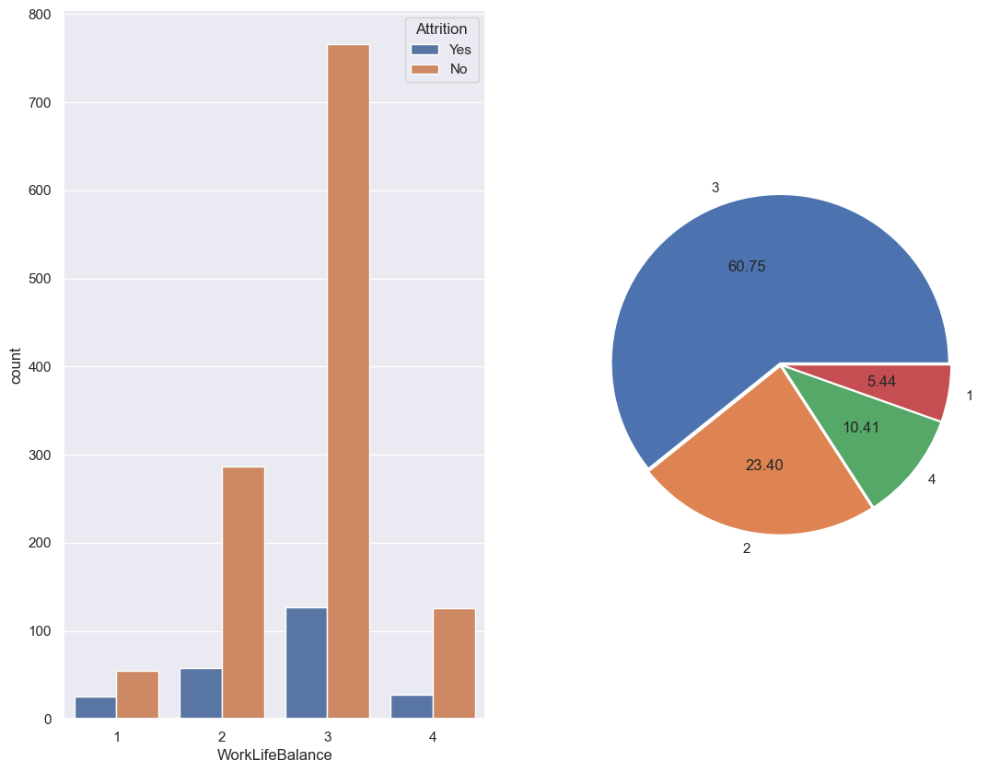

In [132]:
fig,axs=plt.subplots(1,2,figsize=(13,10))
sns.countplot(df['WorkLifeBalance'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['WorkLifeBalance'].value_counts().values,labels=df['WorkLifeBalance'].value_counts().index,explode=[.01,.01,.01,.01],autopct='%.2f')

# Observation-

Here it comes the same thing the work life balance which we saw in the last visualization, so here we can clearly see that as the work life balance is increasing the employee attrition rate is decreasing

# How company's stock options effects employee attrition-

([<matplotlib.patches.Wedge at 0x2334b1ff160>,
 [Text(0.244684928085296, 1.0826953800436636, '0'),
  Text(-0.7497593663688953, -0.8185113881566419, '1'),
  Text(0.8482727719567147, -0.7159143135577551, '2'),
  Text(1.0917357729033659, -0.20053179838392224, '3')],
 [Text(0.13446649201083832, 0.5949947584023737, '42.93'),
  Text(-0.4120299220585821, -0.449812564662659, '40.54'),
  Text(0.4661679197239602, -0.3934303885317393, '10.75'),
  Text(0.5999629022261741, -0.11020215947224554, '5.78')])

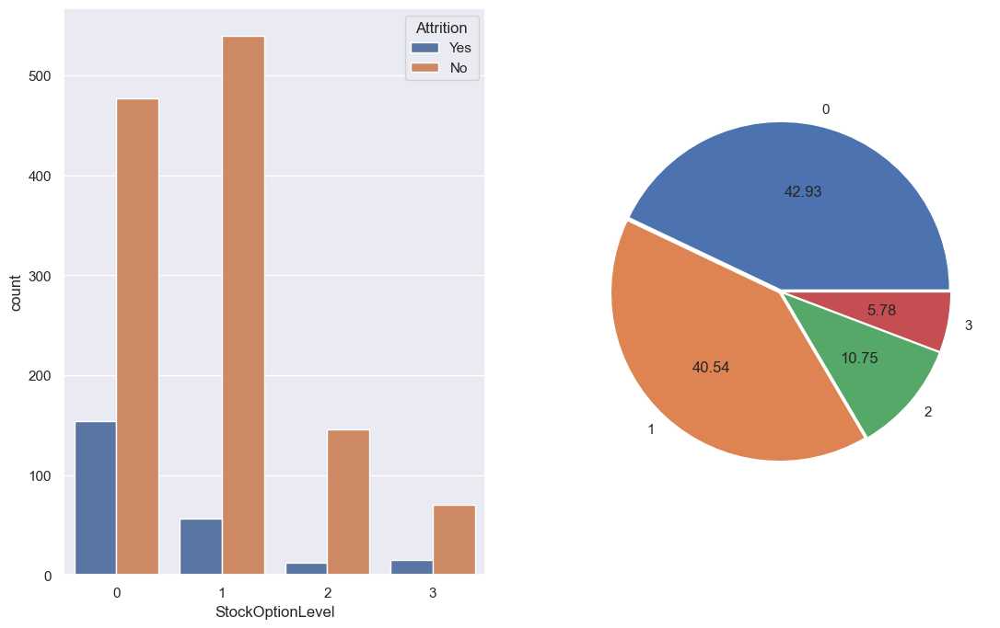

In [133]:
fig,axs=plt.subplots(1,2,figsize=(13,8))
sns.countplot(df['StockOptionLevel'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['StockOptionLevel'].value_counts().values,labels=df['StockOptionLevel'].value_counts().index,explode=[.01,.01,.01,.01],autopct='%.2f')

# Observations-

Here we can notice if employees have stock options from their current organization the employee attrition rate decreases which may be due to the reasons they are more faithful in investing in their own company shares.

# How relationship satisfaction effects the employee attrition-

([<matplotlib.patches.Wedge at 0x2334b2ad250>,
 [Text(0.6174224392093188, 0.9224367358040416, '3'),
  Text(-1.0736972796818545, 0.2815566578928398, '4'),
  Text(-0.2815567081562372, -1.0736972665012348, '2'),
  Text(0.9224366779967768, -0.6174225255740764, '1')],
 [Text(0.3393042233492653, 0.5069246926490678, '31.22'),
  Text(-0.5900498564017398, 0.1547293345176867, '29.39'),
  Text(-0.1547293621399141, -0.5900498491583361, '20.61'),
  Text(0.5069246608811114, -0.3393042708109788, '18.78')])

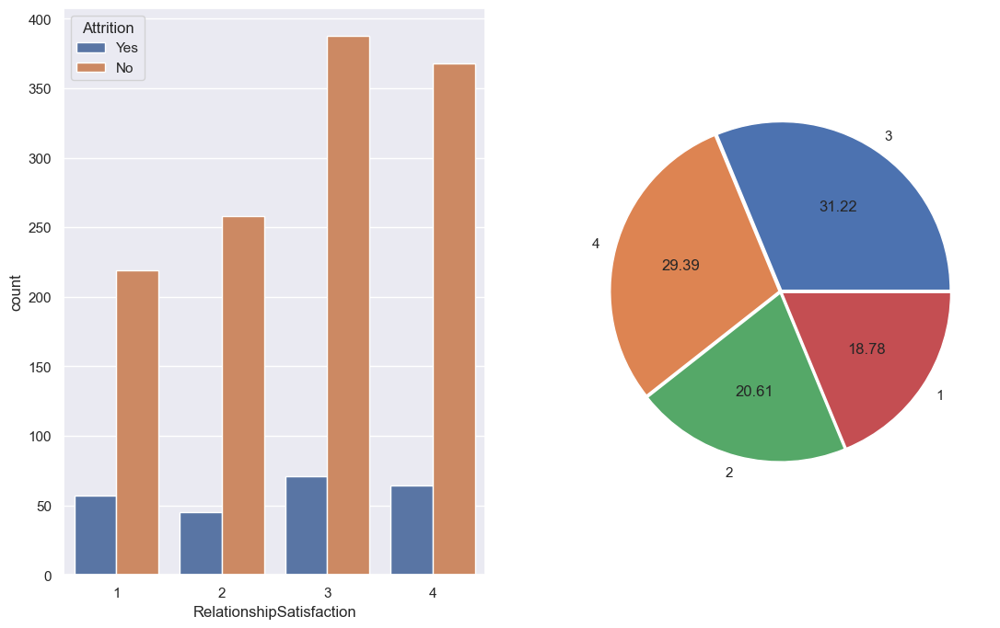

In [134]:
fig,axs=plt.subplots(1,2,figsize=(13,8))
sns.countplot(df['RelationshipSatisfaction'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['RelationshipSatisfaction'].value_counts().values,labels=df['RelationshipSatisfaction'].value_counts().index,explode=[.01,.01,.01,.01],autopct='%.2f')

# Observations-

Here we can notice that how important relationship satifaction in an organization is, as we can see that as the relationship satisfaction is increasing we can notice a declination in the attrition rate.

# Analysis of how company's environment effects the employee attrition-

([<matplotlib.patches.Wedge at 0x2334b370040>,
 [Text(0.6291996143131388, 0.9144440088645107, '3'),
  Text(-1.0748909114190726, 0.27696485074585847, '4'),
  Text(-0.2815567081562372, -1.0736972665012348, '2'),
  Text(0.9117462490671664, -0.6331025014260747, '1')],
 [Text(0.34577636462253575, 0.5025322931597761, '30.82'),
  Text(-0.5907058161852561, 0.15220590896844471, '30.34'),
  Text(-0.1547293621399141, -0.5900498491583361, '19.52'),
  Text(0.5010497404783526, -0.34792119447739234, '19.32')])

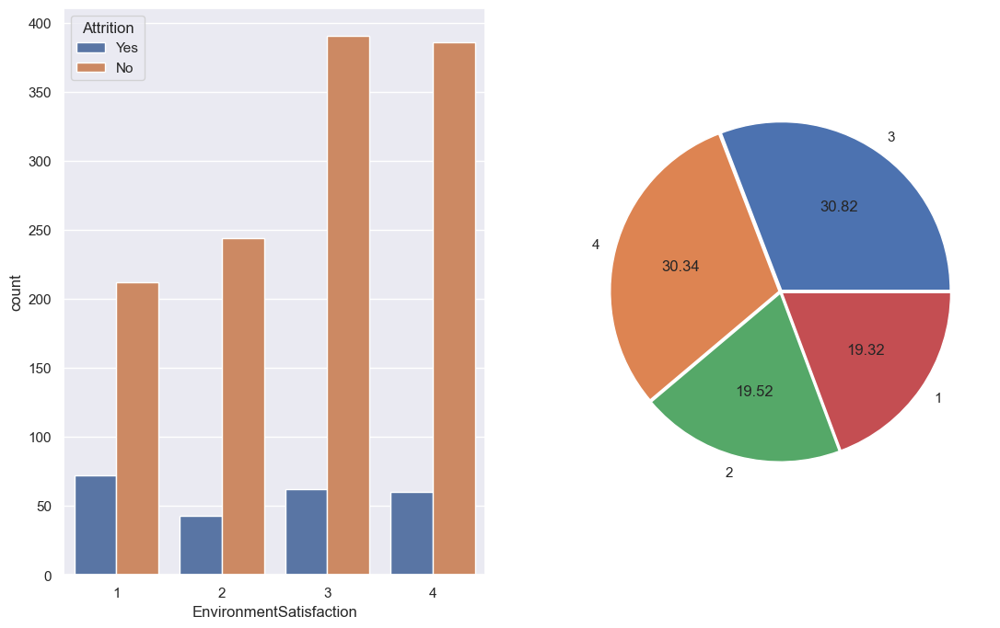

In [135]:
fig,axs=plt.subplots(1,2,figsize=(13,8))
sns.countplot(df['EnvironmentSatisfaction'],hue=df['Attrition'],ax=axs[0])
plt.pie(x=df['EnvironmentSatisfaction'].value_counts().values,labels=df['EnvironmentSatisfaction'].value_counts().index,explode=[.01,.01,.01,.01],autopct='%.2f')

# Observations-

Here we can see that company's evironment also plays a significant role in an employee's life.As they get the better environment satisfaction there will be less attrition.

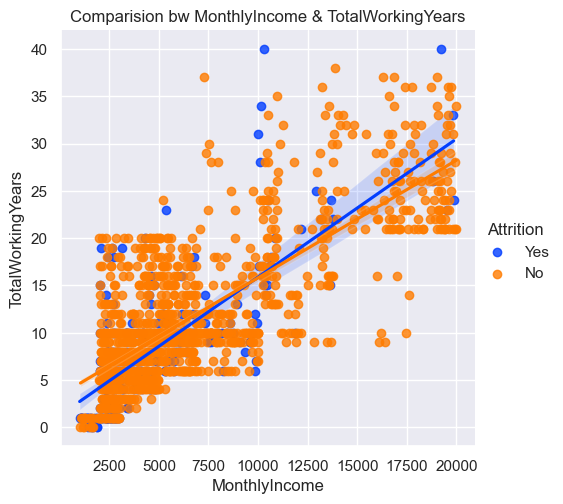

In [136]:
sns.lmplot(x='MonthlyIncome',y='TotalWorkingYears',data=df,hue='Attrition',palette='bright')
plt.title('Comparision bw MonthlyIncome & TotalWorkingYears')
plt.show()

# Observations-

Here we may notice is that once the employee get better monthly income there are very less chnaces of attrition. 

# Mutivariate analysis-

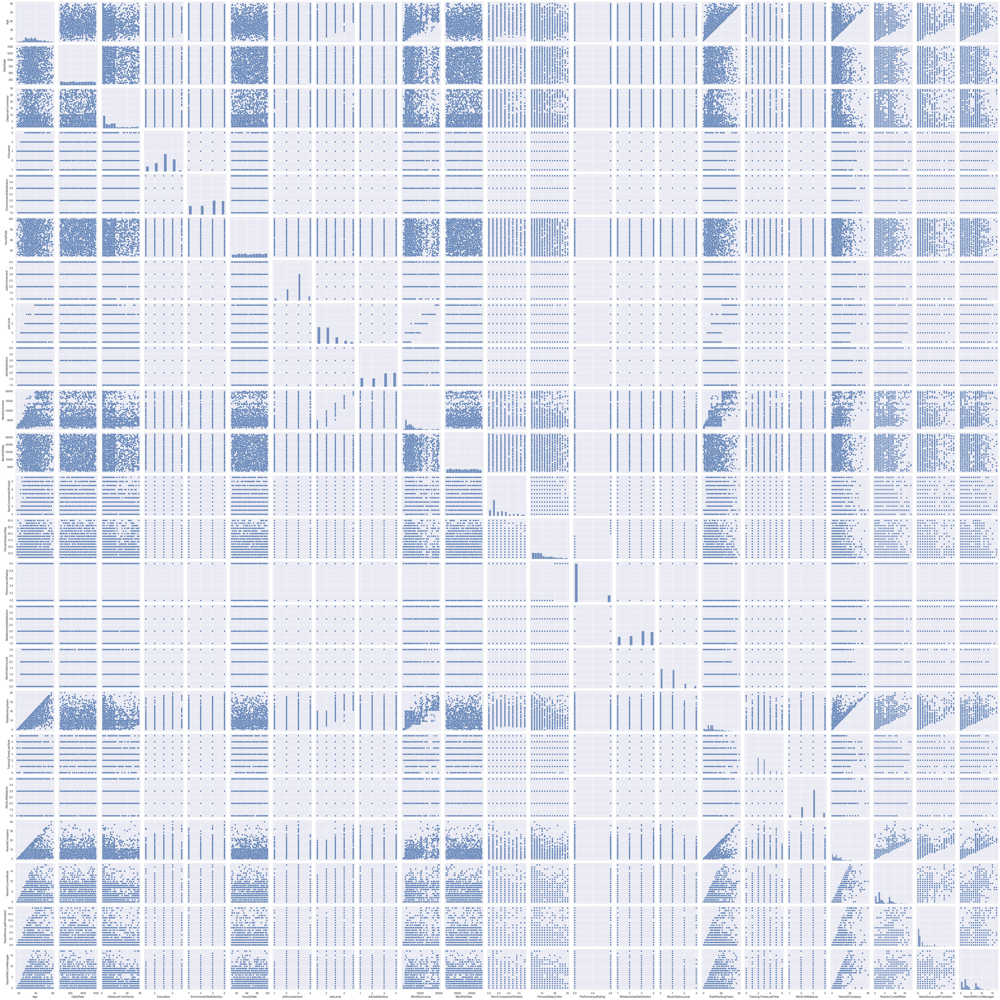

In [137]:
sns.pairplot(df)

# Checking distribution of data in all features-

In [1214]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

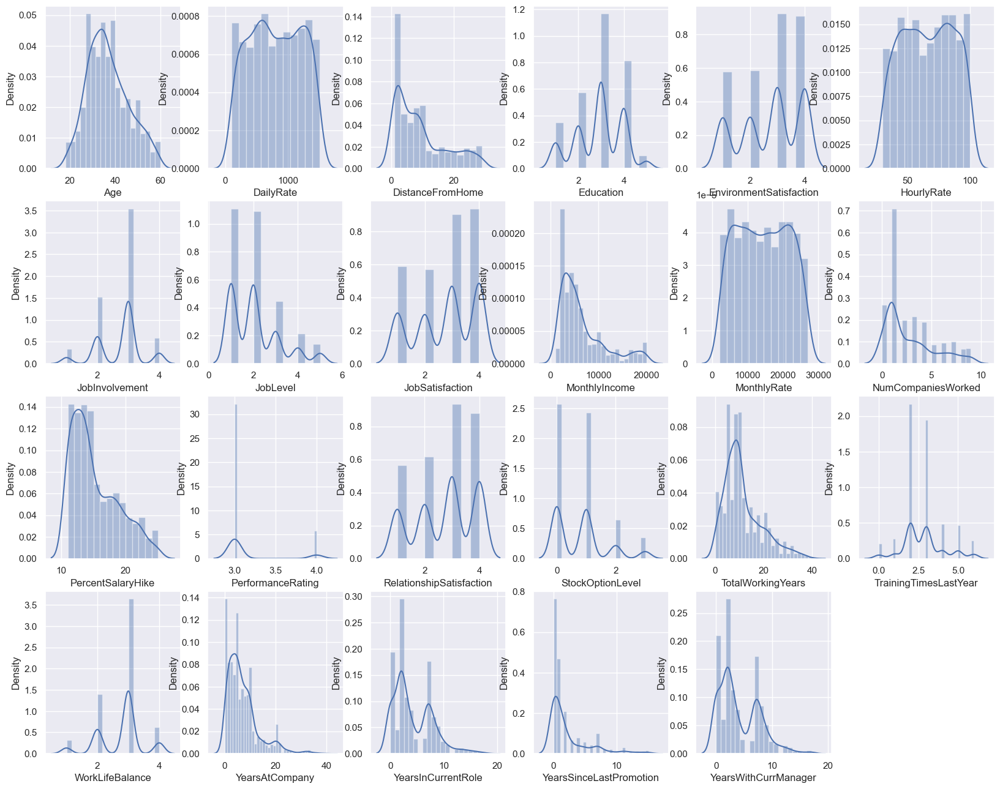

In [1215]:
plt.figure(figsize=(20,20))
plotnumber=1

for col in continous:
    if plotnumber<=27:
        ax=plt.subplot(5,6,plotnumber)
        sns.distplot(df[col])
        plt.xlabel(col)
        
    plotnumber+=1
plt.show()           

# Observations-

Here we can see that distribution of data is normal in continous data column but in categorical data columns we can see skewed data.
We are not worried about the skewness in categorical data columns like yearssincelastpromotion,yearsincurrentrole,yearsatcompany,worklifebalance,stockoptionlevel,performancerating etc. so we will move further for model bulding.

In [1216]:
df.skew().sort_values()

WorkLifeBalance            -0.552480
JobInvolvement             -0.498419
JobSatisfaction            -0.329672
EnvironmentSatisfaction    -0.321654
RelationshipSatisfaction   -0.302828
Education                  -0.289681
HourlyRate                 -0.032311
DailyRate                  -0.003519
MonthlyRate                 0.018578
Age                         0.413286
TrainingTimesLastYear       0.553124
PercentSalaryHike           0.821128
YearsWithCurrManager        0.833451
YearsInCurrentRole          0.917363
DistanceFromHome            0.958118
StockOptionLevel            0.968980
JobLevel                    1.025401
NumCompaniesWorked          1.026471
TotalWorkingYears           1.117172
MonthlyIncome               1.369817
YearsAtCompany              1.764529
PerformanceRating           1.921883
YearsSinceLastPromotion     1.984290
dtype: float64

Here we can see that skewness is high in continous data columns like monthlyincome,distancefromhome,totalworkingyears as in the distribution plot we could see the data spread is skewed so we will apply data transformation methods to remove skewness from the particular columns.

In [1217]:
x=df.columns.to_list()

In [1218]:
for i in x:
    print(i,df[i].nunique())

Age 43
Attrition 2
BusinessTravel 3
DailyRate 886
Department 3
DistanceFromHome 29
Education 5
EducationField 6
EnvironmentSatisfaction 4
Gender 2
HourlyRate 71
JobInvolvement 4
JobLevel 5
JobRole 9
JobSatisfaction 4
MaritalStatus 3
MonthlyIncome 1349
MonthlyRate 1427
NumCompaniesWorked 10
OverTime 2
PercentSalaryHike 15
PerformanceRating 2
RelationshipSatisfaction 4
StockOptionLevel 4
TotalWorkingYears 40
TrainingTimesLastYear 7
WorkLifeBalance 4
YearsAtCompany 37
YearsInCurrentRole 19
YearsSinceLastPromotion 16
YearsWithCurrManager 18


# Removing skewness through Cube root transformation method-

Skewness of any continous data column should always be bw range -0.5 to 0.5 only.

Here we are not concerned about the skewness in categorical data we will remove skewness from the continues & discrete features only.

In [1219]:
df['MonthlyIncome']=np.cbrt(df['MonthlyIncome'])

In [1220]:
df['DistanceFromHome']=np.cbrt(df['DistanceFromHome'])

In [1221]:
df['TotalWorkingYears']=np.cbrt(df['TotalWorkingYears'])

In [1222]:
df['YearsAtCompany']=np.cbrt(df['YearsAtCompany'])

In [1223]:
df.skew()

Age                         0.413286
DailyRate                  -0.003519
DistanceFromHome            0.186998
Education                  -0.289681
EnvironmentSatisfaction    -0.321654
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    1.025401
JobSatisfaction            -0.329672
MonthlyIncome               0.677032
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears          -0.395296
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany             -0.367351
YearsInCurrentRole          0.917363
YearsSinceLastPromotion     1.984290
YearsWithCurrManager        0.833451
dtype: float64

so here we can see that we have reduced the skewness in the continous data column i.e monthly income other than that all features having skewness above or below the specified range are categorical in nature so we have not removed their skewness.

# Checking for the outliers in all features-

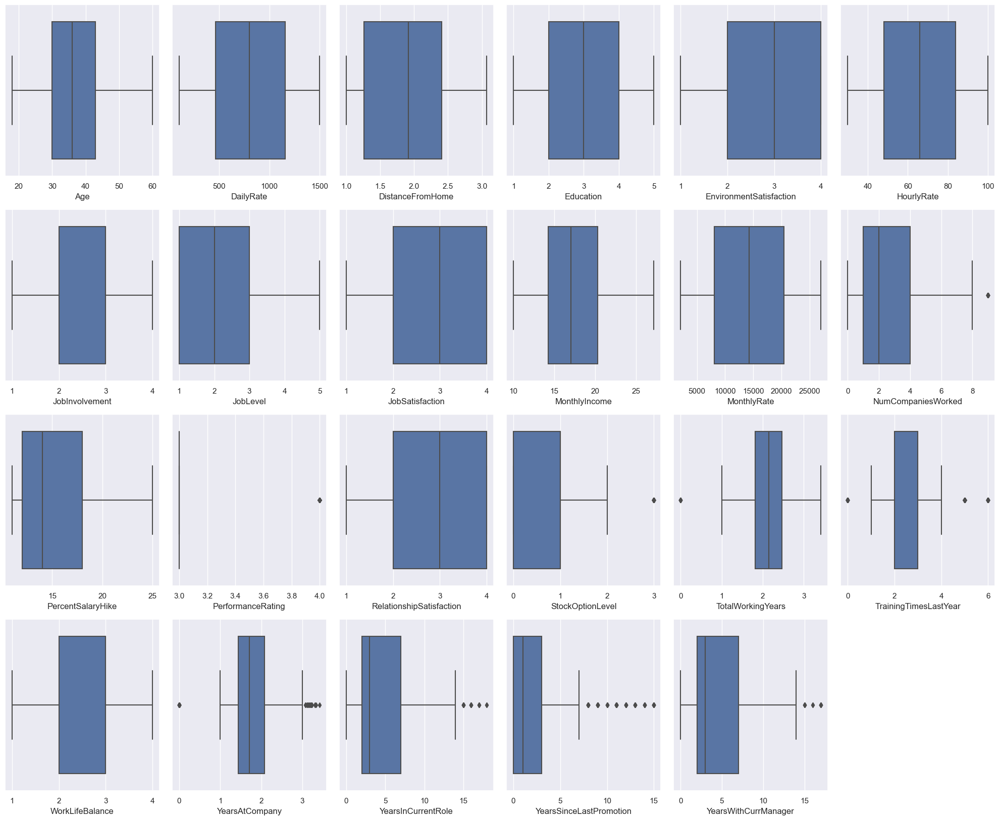

In [1224]:
plt.figure(figsize=(20,20))
plotnumber=1

for col in continous:
    if plotnumber<=27:
        ax=plt.subplot(5,6,plotnumber)
        sns.boxplot(df[col],orient="h")
        plt.xlabel(col)
        
    plotnumber+=1
plt.tight_layout()  

# Observations-

Outliers has a huge impact on the model performance as it lowers down the accuracy & precision of the model.

so here we can see that all the continous data columns do not have the outliers.
Only categorical data columns has the outliers about which we are not worried. we do not remove skewness and outliers from categorical data.

# Encoding of object data-

In [1225]:
df[objects].nunique()

Attrition         2
BusinessTravel    3
Department        3
EducationField    6
Gender            2
JobRole           9
MaritalStatus     3
OverTime          2
dtype: int64

In [1226]:
from sklearn.preprocessing import LabelEncoder

In [1227]:
le=LabelEncoder()

In [1228]:
df[['Attrition','BusinessTravel','Department','Gender','MaritalStatus','OverTime']]=df[['Attrition','BusinessTravel','Department','Gender','MaritalStatus','OverTime']].apply(LabelEncoder().fit_transform)

In [1229]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1.000000,2,Life Sciences,2,0,...,3,1,0,2.000000,0,1,1.817121,4,0,5
1,49,0,1,279,1,2.000000,1,Life Sciences,3,1,...,4,4,1,2.154435,3,3,2.154435,7,1,7
2,37,1,2,1373,1,1.259921,2,Other,4,1,...,3,2,0,1.912931,3,3,0.000000,0,0,0
3,33,0,1,1392,1,1.442250,4,Life Sciences,4,0,...,3,3,0,2.000000,3,3,2.000000,7,3,0
4,27,0,2,591,1,1.259921,1,Medical,1,1,...,3,4,1,1.817121,3,3,1.259921,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1,884,1,2.843867,2,Medical,3,1,...,3,3,1,2.571282,3,3,1.709976,2,0,3
1466,39,0,2,613,1,1.817121,1,Medical,4,1,...,3,1,1,2.080084,5,3,1.912931,7,1,7
1467,27,0,2,155,1,1.587401,3,Life Sciences,2,1,...,4,2,1,1.817121,0,3,1.817121,2,0,3
1468,49,0,1,1023,2,1.259921,3,Medical,4,1,...,3,4,0,2.571282,3,2,2.080084,6,0,8


# Applying Binary encoder as in these two columns we are having more categories-

In [1231]:
from category_encoders import BinaryEncoder

In [1232]:
be=BinaryEncoder()

In [1233]:
df[['EducationField_0','EducationField_1','EducationField_2','JobRole_0','JobRole_1','JobRole_2','JobRole_3']]=be.fit_transform(df[['EducationField','JobRole']])

In [1234]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,EducationField_0,EducationField_1,EducationField_2,JobRole_0,JobRole_1,JobRole_2,JobRole_3
0,41,1,2,1102,2,1.000000,2,Life Sciences,2,0,...,4,0,5,0,0,1,0,0,0,1
1,49,0,1,279,1,2.000000,1,Life Sciences,3,1,...,7,1,7,0,0,1,0,0,1,0
2,37,1,2,1373,1,1.259921,2,Other,4,1,...,0,0,0,0,1,0,0,0,1,1
3,33,0,1,1392,1,1.442250,4,Life Sciences,4,0,...,7,3,0,0,0,1,0,0,1,0
4,27,0,2,591,1,1.259921,1,Medical,1,1,...,2,2,2,0,1,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1,884,1,2.843867,2,Medical,3,1,...,2,0,3,0,1,1,0,0,1,1
1466,39,0,2,613,1,1.817121,1,Medical,4,1,...,7,1,7,0,1,1,0,1,0,1
1467,27,0,2,155,1,1.587401,3,Life Sciences,2,1,...,2,0,3,0,0,1,0,1,0,0
1468,49,0,1,1023,2,1.259921,3,Medical,4,1,...,6,0,8,0,1,1,0,0,0,1


In [1235]:
#Dropping the existing object data columns-

In [1236]:
df.drop(columns=['EducationField','JobRole'],axis=1,inplace=True)

In [1237]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 36 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1470 non-null   int64  
 1   Attrition                 1470 non-null   int32  
 2   BusinessTravel            1470 non-null   int32  
 3   DailyRate                 1470 non-null   int64  
 4   Department                1470 non-null   int32  
 5   DistanceFromHome          1470 non-null   float64
 6   Education                 1470 non-null   int64  
 7   EnvironmentSatisfaction   1470 non-null   int64  
 8   Gender                    1470 non-null   int32  
 9   HourlyRate                1470 non-null   int64  
 10  JobInvolvement            1470 non-null   int64  
 11  JobLevel                  1470 non-null   int64  
 12  JobSatisfaction           1470 non-null   int64  
 13  MaritalStatus             1470 non-null   int32  
 14  MonthlyI

Now here we can see that all the object data columns has been converted to the numeric data columns.

# Correlation bw features and label-

In [1238]:
df.corr()['Attrition'].sort_values(ascending=False)

Attrition                   1.000000
OverTime                    0.246118
MaritalStatus               0.162070
JobRole_3                   0.134125
JobRole_2                   0.104847
EducationField_0            0.102125
DistanceFromHome            0.079090
Department                  0.063991
NumCompaniesWorked          0.043494
Gender                      0.029453
MonthlyRate                 0.015170
PerformanceRating           0.002889
BusinessTravel              0.000074
HourlyRate                 -0.006846
PercentSalaryHike          -0.013478
Education                  -0.031373
YearsSinceLastPromotion    -0.033019
EducationField_1           -0.043171
RelationshipSatisfaction   -0.045872
EducationField_2           -0.046914
JobRole_0                  -0.047117
DailyRate                  -0.056652
TrainingTimesLastYear      -0.059478
WorkLifeBalance            -0.063939
JobRole_1                  -0.069076
EnvironmentSatisfaction    -0.103369
JobSatisfaction            -0.103481
J

# Graphical Representation of correlationship between features & target variable-

Text(0.5, 1.0, 'Correlationship bw Features abd Labels')

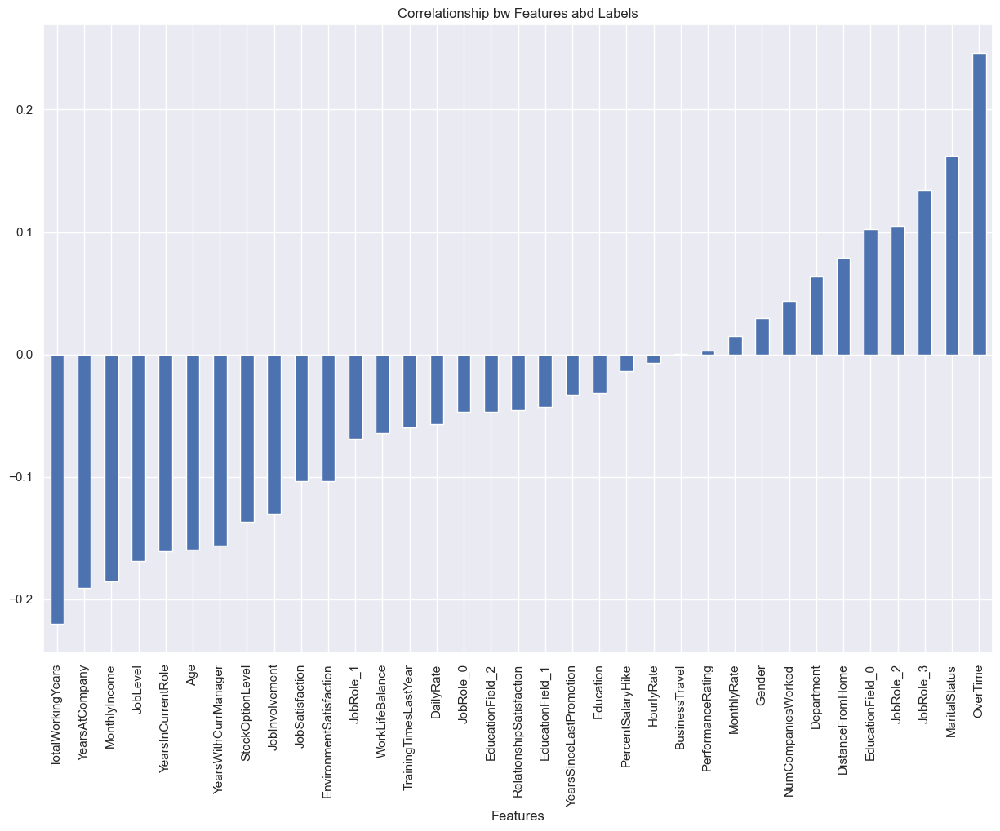

In [1239]:
plt.figure(figsize=(15,10))
df.corr()['Attrition'].sort_values().drop(['Attrition']).plot(kind='bar')
plt.xlabel('Features')
plt.title('Correlationship bw Features abd Labels')

# Observations-

1. Here we can notice that overtime & total working years has the highest impact on the employee attrition.
2. Monthly income & marital status also having an good amount of impact over the attrition rate of employees.

It is very much clear from our analysis that employees want to have the work life balance like if employees are doing much overtime than the employee attrition rate gets hugely impacted.

similary if we look at the monthly income which is also a crucial factor which largly impact the attrition because of not getting the desired perks & salary employee attrition rate hugely increases as employees starts looking for the better opportunities available.

similarly marital status also plays a big role in employee attrition as we saw in EDA that single employees are more prone towards the attrition.

# Separating features and label-

In [1240]:
x=df.drop(columns=['Attrition'],axis=1)
y=df.Attrition

In [1241]:
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,...,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,EducationField_0,EducationField_1,EducationField_2,JobRole_0,JobRole_1,JobRole_2,JobRole_3
0,41,2,1102,2,1.000000,2,2,0,94,3,...,4,0,5,0,0,1,0,0,0,1
1,49,1,279,1,2.000000,1,3,1,61,2,...,7,1,7,0,0,1,0,0,1,0
2,37,2,1373,1,1.259921,2,4,1,92,2,...,0,0,0,0,1,0,0,0,1,1
3,33,1,1392,1,1.442250,4,4,0,56,3,...,7,3,0,0,0,1,0,0,1,0
4,27,2,591,1,1.259921,1,1,1,40,3,...,2,2,2,0,1,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,1,884,1,2.843867,2,3,1,41,4,...,2,0,3,0,1,1,0,0,1,1
1466,39,2,613,1,1.817121,1,4,1,42,2,...,7,1,7,0,1,1,0,1,0,1
1467,27,2,155,1,1.587401,3,2,1,87,4,...,2,0,3,0,0,1,0,1,0,0
1468,49,1,1023,2,1.259921,3,4,1,63,2,...,6,0,8,0,1,1,0,0,0,1


# Standardization of data-

In [1049]:
from sklearn.preprocessing import StandardScaler

In [1050]:
scaler=StandardScaler()
x_scaled=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)

In [1051]:
x_scaled

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,...,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,EducationField_0,EducationField_1,EducationField_2,JobRole_0,JobRole_1,JobRole_2,JobRole_3
0,0.446350,0.590048,0.742527,1.401512,-1.412629,-0.891688,-0.660531,-1.224745,1.383138,0.379672,...,-0.063296,-0.679146,0.245834,-0.525397,-0.799247,0.472188,-0.314093,-0.675935,-1.001361,0.852865
1,1.322365,-0.913194,-1.297775,-0.493817,0.159829,-1.868426,0.254625,0.816497,-0.240677,-1.026167,...,0.764998,-0.368715,0.806541,-0.525397,-0.799247,0.472188,-0.314093,-0.675935,0.998640,-1.172518
2,0.008343,0.590048,1.414363,-0.493817,-1.003914,-0.891688,1.169781,0.816497,1.284725,-1.026167,...,-1.167687,-0.679146,-1.155935,-0.525397,1.251177,-2.117799,-0.314093,-0.675935,0.998640,0.852865
3,-0.429664,-0.913194,1.461466,-0.493817,-0.717210,1.061787,1.169781,-1.224745,-0.486709,0.379672,...,0.764998,0.252146,-1.155935,-0.525397,-0.799247,0.472188,-0.314093,-0.675935,0.998640,-1.172518
4,-1.086676,0.590048,-0.524295,-0.493817,-1.003914,-1.868426,-1.575686,0.816497,-1.274014,0.379672,...,-0.615492,-0.058285,-0.595227,-0.525397,1.251177,0.472188,-0.314093,-0.675935,0.998640,0.852865
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-0.101159,-0.913194,0.202082,-0.493817,1.486775,-0.891688,0.254625,0.816497,-1.224807,1.785511,...,-0.615492,-0.679146,-0.314873,-0.525397,1.251177,0.472188,-0.314093,-0.675935,0.998640,0.852865
1466,0.227347,0.590048,-0.469754,-0.493817,-0.127741,-1.868426,1.169781,0.816497,-1.175601,-1.026167,...,0.764998,-0.368715,0.806541,-0.525397,1.251177,0.472188,-0.314093,1.479432,-1.001361,0.852865
1467,-1.086676,0.590048,-1.605183,-0.493817,-0.488966,0.085049,-0.660531,0.816497,1.038693,1.785511,...,-0.615492,-0.679146,-0.314873,-0.525397,-0.799247,0.472188,-0.314093,1.479432,-1.001361,-1.172518
1468,1.322365,-0.913194,0.546677,1.401512,-1.003914,0.085049,1.169781,0.816497,-0.142264,-1.026167,...,0.488900,-0.679146,1.086895,-0.525397,1.251177,0.472188,-0.314093,-0.675935,-1.001361,0.852865


# Checking multicollinearity among features with variance inflation factor-

In [1052]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [1053]:
vif=pd.DataFrame()
vif['Score']=[variance_inflation_factor(x_scaled,i) for i in range(x_scaled.shape[1])]
vif['features']=x.columns
vif

,Score,features
0,2.034043,Age
1,1.020306,BusinessTravel
2,1.027529,DailyRate
3,1.924955,Department
4,1.017557,DistanceFromHome
5,1.082255,Education
6,1.029429,EnvironmentSatisfaction
7,1.029176,Gender
8,1.023307,HourlyRate
9,1.020047,JobInvolvement


Here we can see that there is no multicollinearity among features as the vif score is under limit<=10.

# Resolving class imbalance issue in target variable with oversampling method-

In [1054]:
y.value_counts()

0    1233
1     237
Name: Attrition, dtype: int64

In [1055]:
from imblearn.over_sampling import SMOTE

In [1056]:
sm=SMOTE()
x_scaled,y=sm.fit_resample(x_scaled,y)

In [1057]:
y.value_counts()

1    1233
0    1233
Name: Attrition, dtype: int64

# Model Building-I with all the features-

In [1058]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,roc_curve,roc_auc_score,classification_report,confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import cross_val_score

In [1059]:
maxacc=0
maxrs=0

for i in range(1,1000):
    x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=.30,random_state=i)
    lr=LogisticRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    accuracy=accuracy_score(y_test,pred)
    if accuracy>maxacc:
        maxacc=accuracy
        maxrs=i
print('The best accuracy is-',maxacc,'random state is-',maxrs)        

The best accuracy is- 0.831081081081081 random state is- 138


In [1060]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.30,random_state=89)

In [1061]:
def score(clf,x_train,x_test,y_train,y_test,train=True):
    if train:
        y_pred=clf.predict(x_train)
        
        print('=======================Train result======================')
        print(f'accuracy score:{accuracy_score(y_train,y_pred)*100:.2f}%')
        
        
    elif train==False:
        pred=clf.predict(x_test)
        
        print('=======================Test Result=======================')
        print(f'accuracy_score:{accuracy_score(y_test,pred)*100:.2f}%')
        print('\n\nClassification report\n',classification_report(y_test,pred))

# Logistic Regression-

In [1062]:
lr=LogisticRegression()
lr.fit(x_train,y_train)

LogisticRegression()

In [1063]:
lr.predict_proba(x_test)

array([[0.95797266, 0.04202734],
       [0.05943878, 0.94056122],
       [0.1555691 , 0.8444309 ],
       ...,
       [0.75324954, 0.24675046],
       [0.21443119, 0.78556881],
       [0.18107139, 0.81892861]])

In [1064]:
score(lr,x_train,x_test,y_train,y_test,train=True)
score(lr,x_train,x_test,y_train,y_test,train=False)

=======================Train result======================
accuracy score:79.72%
=======================Test Result=======================
accuracy_score:81.35%


Classification report
               precision    recall  f1-score   support

           0       0.82      0.80      0.81       368
           1       0.81      0.83      0.82       372

    accuracy                           0.81       740
   macro avg       0.81      0.81      0.81       740
weighted avg       0.81      0.81      0.81       740



A clear underfitting can be seen in the model as train score is 80% and test score is 82% only.

# Cross validation score-

In [1065]:
scor=cross_val_score(lr,x_scaled,y,cv=10)
print(scor)
print(scor.mean())

[0.77327935 0.78137652 0.80161943 0.78137652 0.81781377 0.8097166
 0.80081301 0.78455285 0.79674797 0.80894309]
0.7956239096803923


# KNN Model-

In [1066]:
from sklearn.neighbors import KNeighborsClassifier 

In [1067]:
knn=KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [1068]:
score(knn,x_train,x_test,y_train,y_test,train=True)
score(knn,x_train,x_test,y_train,y_test,train=False)

=======================Train result======================
accuracy score:86.62%
=======================Test Result=======================
accuracy_score:79.46%


Classification report
               precision    recall  f1-score   support

           0       0.99      0.59      0.74       368
           1       0.71      0.99      0.83       372

    accuracy                           0.79       740
   macro avg       0.85      0.79      0.79       740
weighted avg       0.85      0.79      0.79       740



A clear underfitting can be seen in the model as train score is 86% and test score is 80% only.

In [1069]:
error_rate=[]

for i in range(1,100):
    knn=KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train,y_train)
    pred=knn.predict(x_test)
    error_rate.append(np.mean(pred!=y_test))   

# Plotting error rate to get the best value of k-

Text(0, 0.5, 'Error rate')

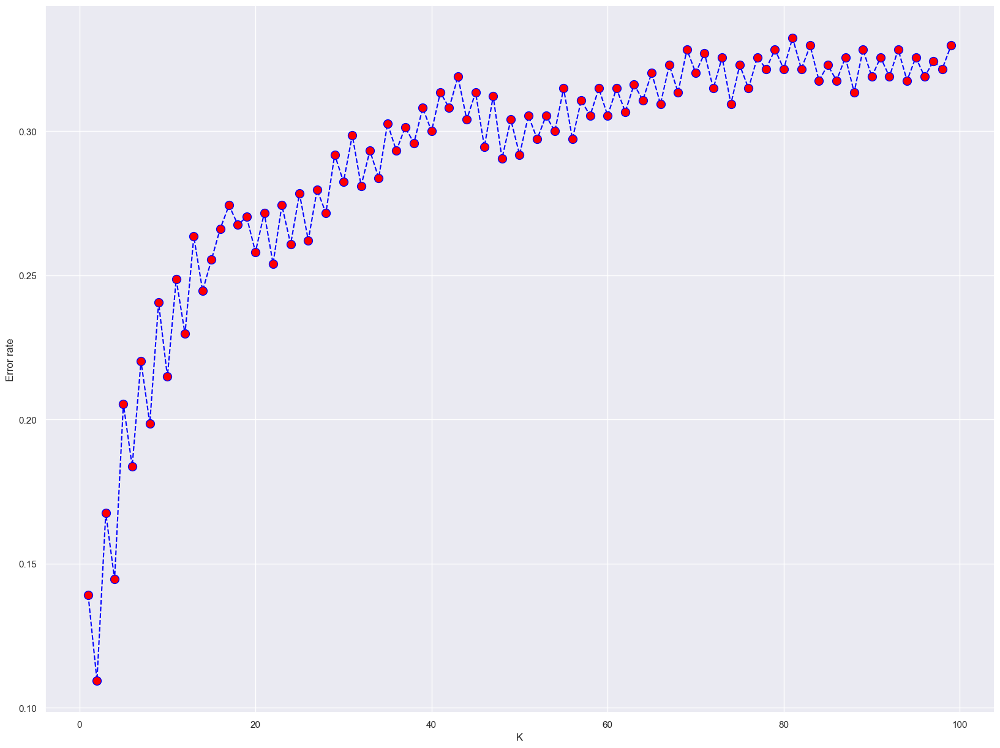

In [1070]:
plt.figure(figsize=(20,15))
plt.plot(range(1,100),error_rate,color='Blue',linestyle='dashed',marker='o',markersize=10,markerfacecolor='red')
plt.xlabel('K')
plt.ylabel('Error rate')

I think k=5 is best other wise our model's error rate is increasing after k=5

# Random forest-

In [1071]:
rf=RandomForestClassifier(n_estimators=5000)
rf.fit(x_train,y_train)

RandomForestClassifier(n_estimators=5000)

In [1072]:
score(rf,x_train,x_test,y_train,y_test,train=True)
score(rf,x_train,x_test,y_train,y_test,train=False)

=======================Train result======================
accuracy score:100.00%
=======================Test Result=======================
accuracy_score:94.46%


Classification report
               precision    recall  f1-score   support

           0       0.93      0.96      0.95       368
           1       0.96      0.92      0.94       372

    accuracy                           0.94       740
   macro avg       0.95      0.94      0.94       740
weighted avg       0.95      0.94      0.94       740



Overfitting can be seen clearly here 

In [1073]:
scor=cross_val_score(rf,x_scaled,y,cv=10)
print(scor)
print(scor.mean())

[0.8097166  0.80161943 0.98380567 0.9757085  0.99190283 0.9757085
 0.9796748  0.9796748  0.98373984 0.97154472]
0.9453095684803001


In [1074]:
rf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=1880988520),
 DecisionTreeClassifier(max_features='auto', random_state=439316324),
 DecisionTreeClassifier(max_features='auto', random_state=1065962519),
 DecisionTreeClassifier(max_features='auto', random_state=1291723212),
 DecisionTreeClassifier(max_features='auto', random_state=672271835),
 DecisionTreeClassifier(max_features='auto', random_state=58174528),
 DecisionTreeClassifier(max_features='auto', random_state=682657587),
 DecisionTreeClassifier(max_features='auto', random_state=469539231),
 DecisionTreeClassifier(max_features='auto', random_state=458477866),
 DecisionTreeClassifier(max_features='auto', random_state=988965234),
 DecisionTreeClassifier(max_features='auto', random_state=1088058725),
 DecisionTreeClassifier(max_features='auto', random_state=1188343974),
 DecisionTreeClassifier(max_features='auto', random_state=372108249),
 DecisionTreeClassifier(max_features='auto', random_state=124085787),
 DecisionTreeCla

# Visalizing random forest decison tree-

<Figure size 2000x1500 with 0 Axes>

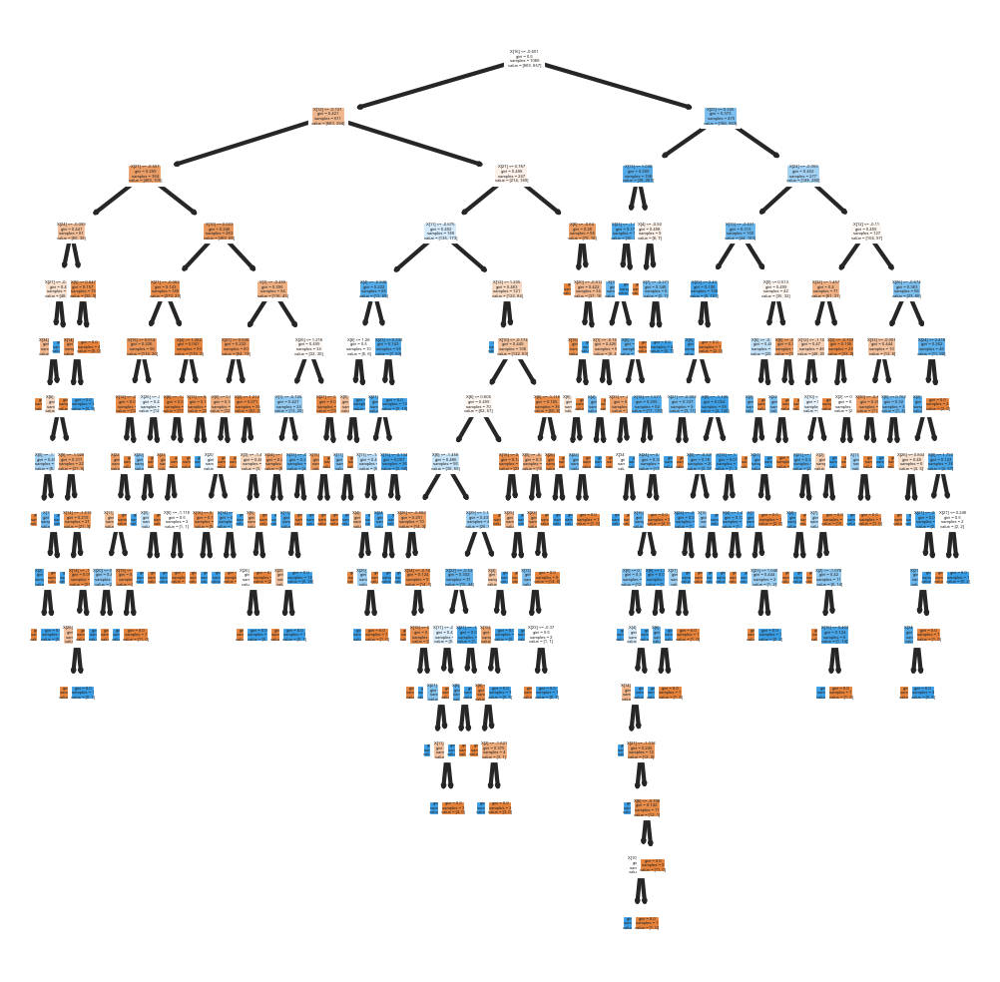

In [1075]:
plt.figure(figsize=(20,15))
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=300)
for i in range(len(list)):
    tree.plot_tree(rf.estimators_[1],filled=True)
fig.savefig('imagenamee.png')    

# Gradient Boosting classifier-

In [1076]:
gb=GradientBoostingClassifier()
gb.fit(x_train,y_train)

GradientBoostingClassifier()

In [1077]:
score(gb,x_train,x_test,y_train,y_test,train=True)
score(gb,x_train,x_test,y_train,y_test,train=False)

=======================Train result======================
accuracy score:97.28%
=======================Test Result=======================
accuracy_score:92.97%


Classification report
               precision    recall  f1-score   support

           0       0.91      0.96      0.93       368
           1       0.96      0.90      0.93       372

    accuracy                           0.93       740
   macro avg       0.93      0.93      0.93       740
weighted avg       0.93      0.93      0.93       740



Looking like a good generalised model here with low bias and low variance.

# Cross validation score-

In [1078]:
scor=cross_val_score(gb,x_scaled,y,cv=10)
print(scor)
print(scor.mean())

[0.67611336 0.73279352 0.97165992 0.9757085  0.96356275 0.96356275
 0.97560976 0.95934959 0.97560976 0.97154472]
0.916551463085481


# Support vector classifier-

In [1079]:
svc=SVC()
svc.fit(x_train,y_train)

SVC()

In [1080]:
score(svc,x_train,x_test,y_train,y_test,train=True)
score(svc,x_train,x_test,y_train,y_test,train=False)

=======================Train result======================
accuracy score:96.70%
=======================Test Result=======================
accuracy_score:93.24%


Classification report
               precision    recall  f1-score   support

           0       0.94      0.92      0.93       368
           1       0.92      0.95      0.93       372

    accuracy                           0.93       740
   macro avg       0.93      0.93      0.93       740
weighted avg       0.93      0.93      0.93       740



Looking like a good generalised model here with low bias and low variance.

# Cross validation score-

In [1081]:
scor=cross_val_score(svc,x_scaled,y,cv=10)
print(scor)
print(scor.mean())

[0.89473684 0.90283401 0.94331984 0.94736842 0.94736842 0.95546559
 0.94308943 0.93495935 0.91869919 0.92682927]
0.9314670353181265


# Ada boost classifier-

In [1082]:
ab=AdaBoostClassifier()
ab.fit(x_train,y_train)

AdaBoostClassifier()

In [1083]:
score(ab,x_train,x_test,y_train,y_test,train=True)
score(ab,x_train,x_test,y_train,y_test,train=False)

=======================Train result======================
accuracy score:91.54%
=======================Test Result=======================
accuracy_score:90.00%


Classification report
               precision    recall  f1-score   support

           0       0.91      0.89      0.90       368
           1       0.89      0.91      0.90       372

    accuracy                           0.90       740
   macro avg       0.90      0.90      0.90       740
weighted avg       0.90      0.90      0.90       740



Looks like a good generalised model with less difference bw train & test accuracy.

# Cross validation score-

In [1084]:
scor=cross_val_score(ab,x_scaled,y,cv=10)
print(scor)
print(scor.mean())

[0.70850202 0.74493927 0.95546559 0.92307692 0.93927126 0.91902834
 0.93089431 0.92276423 0.91463415 0.96341463]
0.8921990717882888


# Bagging classifier-

In [1085]:
bc=BaggingClassifier()
bc.fit(x_train,y_train)

BaggingClassifier()

In [1086]:
score(bc,x_train,x_test,y_train,y_test,train=True)
score(bc,x_train,x_test,y_train,y_test,train=False)

=======================Train result======================
accuracy score:99.36%
=======================Test Result=======================
accuracy_score:90.14%


Classification report
               precision    recall  f1-score   support

           0       0.89      0.92      0.90       368
           1       0.92      0.88      0.90       372

    accuracy                           0.90       740
   macro avg       0.90      0.90      0.90       740
weighted avg       0.90      0.90      0.90       740



# Cross validation score-

In [1087]:
scor=cross_val_score(bc,x_scaled,y,cv=10)
print(scor)
print(scor.mean())

[0.70040486 0.72469636 0.94331984 0.95951417 0.91902834 0.95951417
 0.95528455 0.95121951 0.94308943 0.96341463]
0.9019485862874822


# Decison Tree classifier-

In [1088]:
dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)

DecisionTreeClassifier()

In [1089]:
score(dt,x_train,x_test,y_train,y_test,train=True)
score(dt,x_train,x_test,y_train,y_test,train=False)

=======================Train result======================
accuracy score:100.00%
=======================Test Result=======================
accuracy_score:87.43%


Classification report
               precision    recall  f1-score   support

           0       0.91      0.83      0.87       368
           1       0.85      0.91      0.88       372

    accuracy                           0.87       740
   macro avg       0.88      0.87      0.87       740
weighted avg       0.88      0.87      0.87       740



Overfitting can be seen clearly here 

# Visualization of decision tree-

<Figure size 2000x1500 with 0 Axes>

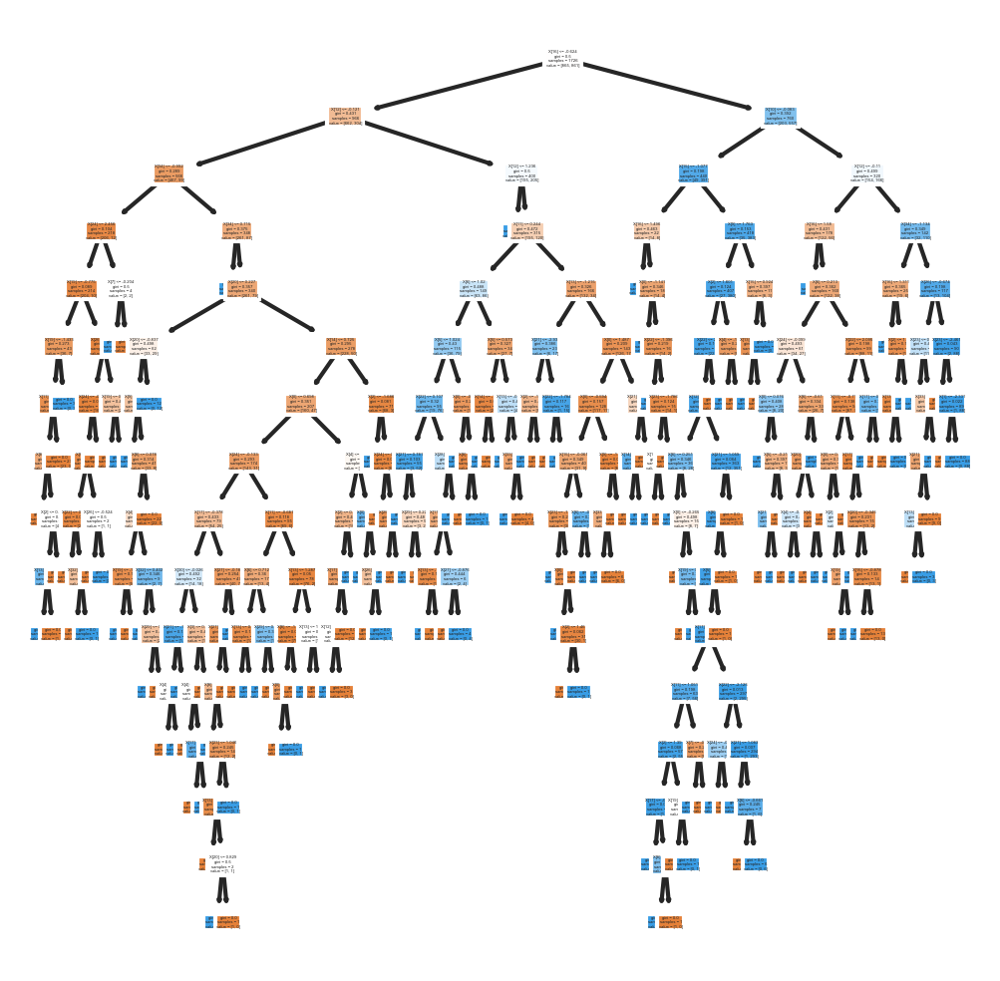

In [1090]:
from sklearn import tree
plt.figure(figsize=(20,15))
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=300)
tree.plot_tree(dt,filled=True)
fig.savefig('imagename.png')

# Cross validation-

In [1091]:
scor=cross_val_score(dt,x_scaled,y,cv=10)
print(scor)
print(scor.mean())

[0.73684211 0.7611336  0.87449393 0.88663968 0.87854251 0.89878543
 0.86178862 0.88211382 0.90243902 0.89430894]
0.8577087653467628


In [1092]:
from sklearn.ensemble import ExtraTreesClassifier

# ExtraTreeClassifier-

In [1093]:
et=ExtraTreesClassifier()
et.fit(x_train,y_train)

ExtraTreesClassifier()

In [1094]:
score(et,x_train,x_test,y_train,y_test,train=True)
score(et,x_train,x_test,y_train,y_test,train=False)

=======================Train result======================
accuracy score:100.00%
=======================Test Result=======================
accuracy_score:97.03%


Classification report
               precision    recall  f1-score   support

           0       0.98      0.96      0.97       368
           1       0.96      0.98      0.97       372

    accuracy                           0.97       740
   macro avg       0.97      0.97      0.97       740
weighted avg       0.97      0.97      0.97       740



it is looking like an overfitted model

# Cross validation-

In [1095]:
scor=cross_val_score(et,x_scaled,y,cv=10)
print(scor)
print(scor.mean())

[0.92712551 0.93117409 0.98380567 0.98380567 0.99190283 0.98380567
 0.96747967 0.98780488 0.98373984 0.96341463]
0.9704058457588625


# Selection of best model-

# Roc curve For train data-

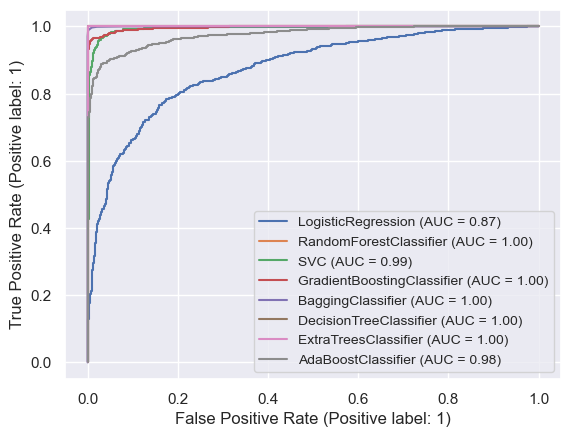

In [1096]:
x=plot_roc_curve(lr,x_train,y_train)
plot_roc_curve(rf,x_train,y_train,ax=x.ax_)
plot_roc_curve(svc,x_train,y_train,ax=x.ax_)
plot_roc_curve(gb,x_train,y_train,ax=x.ax_)
plot_roc_curve(bc,x_train,y_train,ax=x.ax_)
plot_roc_curve(dt,x_train,y_train,ax=x.ax_)
plot_roc_curve(et,x_train,y_train,ax=x.ax_)
plot_roc_curve(ab,x_train,y_train,ax=x.ax_)
plt.legend(prop={'size':10}, loc='lower right')
plt.show()

Here we can see that 

# Roc curve For test data-

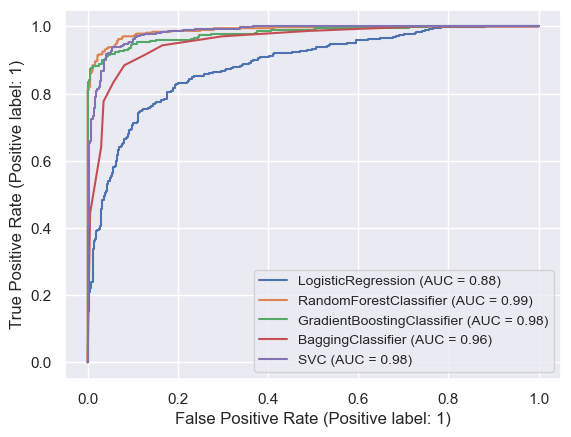

In [1097]:
d=plot_roc_curve(lr,x_test,y_test)

plot_roc_curve(rf,x_test,y_test,ax=d.ax_)

plot_roc_curve(gb,x_test,y_test,ax=d.ax_)

plot_roc_curve(bc,x_test,y_test,ax=d.ax_)

plot_roc_curve(svc,x_test,y_test,ax=d.ax_)

plt.legend(prop={'size':10}, loc='lower right')

plt.show()

# Conclusion-


Here we have selected SVC as the best model as it is looking like a generalised model as it has low bias low variance

# Hyperparameter tunning-

In [1098]:
from sklearn.model_selection import GridSearchCV

In [1099]:
param_grid={'kernel' : ['linear', 'poly', 'rbf', 'sigmoid'],'C': [1, 10, 100, 500,1000],'gamma': [0.001, 0.01,.1],'class_weight':['balanced', None]}

In [1100]:
gs=GridSearchCV(svc,param_grid,cv=10)

In [1101]:
svc.get_params().keys()

dict_keys(['C', 'break_ties', 'cache_size', 'class_weight', 'coef0', 'decision_function_shape', 'degree', 'gamma', 'kernel', 'max_iter', 'probability', 'random_state', 'shrinking', 'tol', 'verbose'])

In [1102]:
gs.fit(x_train,y_train)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid={'C': [1, 10, 100, 500, 1000],
                         'class_weight': ['balanced', None],
                         'gamma': [0.001, 0.01, 0.1],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']})

In [1103]:
gs.best_params_

{'C': 10, 'class_weight': 'balanced', 'gamma': 0.1, 'kernel': 'rbf'}

In [1105]:
final_model=SVC(C=10,class_weight='balanced',gamma=0.1,kernel='rbf')

In [1106]:
final_model.fit(x_train,y_train)

SVC(C=10, class_weight='balanced', gamma=0.1)

In [1107]:
pred=final_model.predict(x_test)

In [1108]:
accuracy_score(y_test,pred)

0.9918918918918919

Here we can see that accuracy of Support vector classifier has been increased to 99% with the help of hyperparameter tunning.
whereas earlier it was giving us 93% accuracy.

# Saving the model-

In [1109]:
import joblib
joblib.dump(final_model,'HR-Analytics')

['HR-Analytics']

In [1110]:
model=joblib.load('HR-Analytics')

In [1111]:
prediction=model.predict(x_test)
prediction

array([0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1,
       1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1,
       1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0,
       1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1,
       1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1,
       0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1,
       0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1,
       1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1,
       1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1,

In [1112]:
a=np.array(y_test)
df=pd.DataFrame()
df['Actual']=a
df['Predicted']=prediction
df

,Actual,Predicted
0,0,0
1,1,1
2,0,1
3,1,1
4,0,0
...,...,...
735,1,1
736,0,0
737,0,0
738,1,1


# Plotting ROC curve-

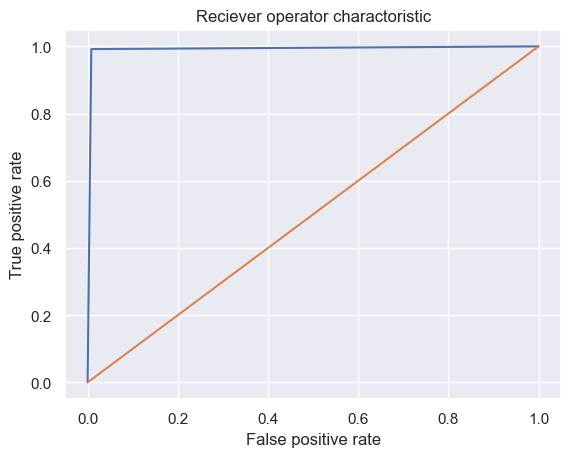

In [1116]:
fpr,tpr,threshold=roc_curve(y_test,final_model.predict(x_test))


plt.figure()
plt.plot(fpr,tpr)
plt.plot([0,1],[0,1])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Reciever operator charactoristic')
plt.show()

# ROC_AUC_SCORE-

In [1117]:
auc_score=roc_auc_score(y_test,prediction)
print(auc_score)

0.9918916549789621


# Conclusion-


1. Here we can see that the area under the curve is 94.7 which is a very good score.

# Model-II

# Applying Principle component analysis-

In [1118]:
from sklearn.decomposition import PCA

In [1119]:
pca=PCA()
pca.fit_transform(x_scaled)

array([[ 0.52830285,  0.68563017,  0.07701426, ...,  0.37205796,
        -0.55923797, -0.04566135],
       [ 1.04691153, -1.80094865, -2.08460818, ...,  0.41206518,
        -0.22382222, -0.02725786],
       [-3.00641173,  0.14159595,  1.00493442, ...,  0.49884381,
         1.27134687,  0.20358432],
       ...,
       [ 2.7506563 ,  2.96426543,  2.13409274, ..., -0.02020493,
         0.52642364,  0.046298  ],
       [-0.65283461, -0.03288449,  0.99382566, ..., -0.26396581,
        -0.26189509, -0.1049005 ],
       [-2.7209795 ,  2.89466989,  1.19286173, ..., -0.51555297,
         0.04901118, -0.0242722 ]])

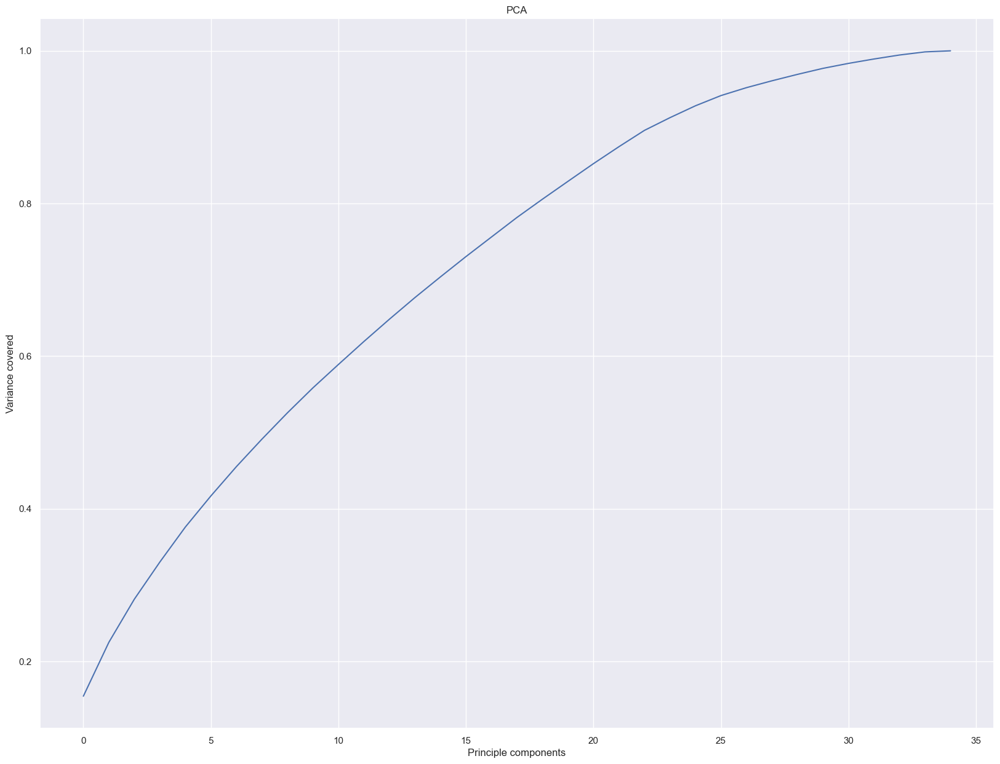

In [1120]:
plt.figure(figsize=(20,15))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principle components')
plt.ylabel('Variance covered')
plt.title('PCA')
plt.show()

In [1121]:
pca=PCA(n_components=30)
new_components=pca.fit_transform(x_scaled)
new_components

array([[ 0.52830285,  0.68563017,  0.07701426, ...,  0.23260091,
         0.57234116,  0.32600197],
       [ 1.04691153, -1.80094865, -2.08460818, ...,  0.57742701,
         0.57313747,  0.08558627],
       [-3.00641173,  0.14159595,  1.00493442, ...,  1.10038526,
         0.58944994, -0.50718233],
       ...,
       [ 2.7506563 ,  2.96426543,  2.13409274, ...,  0.2956586 ,
        -1.03454286, -0.39951536],
       [-0.65283461, -0.03288449,  0.99382566, ...,  0.5494072 ,
        -0.17648566, -0.05292787],
       [-2.7209795 ,  2.89466989,  1.19286173, ..., -0.14572002,
         1.46919312,  0.43942305]])

In [1122]:
princi_comp=pd.DataFrame(new_components,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19','PC20','PC21','PC22','PC23','PC24','PC25','PC26','PC27','PC28','PC29','PC30'])

In [1123]:
princi_comp

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30
0,0.528303,0.685630,0.077014,-1.032372,2.521190,-0.197418,-2.458799,-0.067060,-0.438606,1.123848,...,1.154963,0.505756,1.916503,0.408708,-0.494737,-0.716317,-0.062740,0.232601,0.572341,0.326002
1,1.046912,-1.800949,-2.084608,2.324911,-0.579158,-0.424261,0.154564,0.016636,0.066088,0.293104,...,-1.517570,0.342742,0.403532,-1.314136,1.191220,-0.759322,-0.299806,0.577427,0.573137,0.085586
2,-3.006412,0.141596,1.004934,0.026966,1.450665,0.122317,-0.165471,0.340198,-0.016455,-0.560530,...,1.549292,0.776343,0.924263,0.438206,0.402340,0.788409,0.485863,1.100385,0.589450,-0.507182
3,-0.439407,-0.912806,-0.681006,-1.430792,-0.261381,0.719916,-0.368044,1.435901,-1.822680,0.514477,...,-0.044197,0.304627,-1.285213,-0.516038,0.330832,-0.021804,-0.064430,0.741717,-0.823202,-0.053189
4,-1.488356,-1.249328,1.467417,-0.974120,0.413951,-0.507095,0.063074,-0.943553,1.542388,1.112183,...,-1.088334,0.909787,1.050641,0.566297,-0.759862,-0.039444,0.599404,-0.147674,-0.034465,-0.423187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,-3.278870,1.872244,-0.777208,-0.340872,-0.286699,0.732194,0.818929,2.090475,0.989274,-0.715921,...,0.449360,-0.255601,-0.513639,0.588051,-0.207355,-0.067915,0.825286,0.739591,0.399936,0.617344
2462,-2.082408,0.940488,-0.319905,-0.948403,0.101780,1.260658,-0.839912,-0.357863,-1.332580,-0.116834,...,-0.212423,-0.376363,-1.476240,0.528806,0.015852,0.230426,-0.033503,-1.214752,-0.194150,-0.249714
2463,2.750656,2.964265,2.134093,0.452657,-0.705224,-0.286685,0.382049,-0.264028,0.117754,1.150146,...,-0.045763,0.777750,0.911078,-0.224053,0.489619,0.439441,0.088965,0.295659,-1.034543,-0.399515
2464,-0.652835,-0.032884,0.993826,-0.220200,1.287765,0.349319,-0.701999,-0.210964,0.874669,-1.480082,...,-0.035773,1.372307,-0.362266,-0.342292,-1.306900,-0.291889,0.206469,0.549407,-0.176486,-0.052928


In [1124]:
y.value_counts()

1    1233
0    1233
Name: Attrition, dtype: int64

In [1126]:
princi_comp

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30
0,0.528303,0.685630,0.077014,-1.032372,2.521190,-0.197418,-2.458799,-0.067060,-0.438606,1.123848,...,1.154963,0.505756,1.916503,0.408708,-0.494737,-0.716317,-0.062740,0.232601,0.572341,0.326002
1,1.046912,-1.800949,-2.084608,2.324911,-0.579158,-0.424261,0.154564,0.016636,0.066088,0.293104,...,-1.517570,0.342742,0.403532,-1.314136,1.191220,-0.759322,-0.299806,0.577427,0.573137,0.085586
2,-3.006412,0.141596,1.004934,0.026966,1.450665,0.122317,-0.165471,0.340198,-0.016455,-0.560530,...,1.549292,0.776343,0.924263,0.438206,0.402340,0.788409,0.485863,1.100385,0.589450,-0.507182
3,-0.439407,-0.912806,-0.681006,-1.430792,-0.261381,0.719916,-0.368044,1.435901,-1.822680,0.514477,...,-0.044197,0.304627,-1.285213,-0.516038,0.330832,-0.021804,-0.064430,0.741717,-0.823202,-0.053189
4,-1.488356,-1.249328,1.467417,-0.974120,0.413951,-0.507095,0.063074,-0.943553,1.542388,1.112183,...,-1.088334,0.909787,1.050641,0.566297,-0.759862,-0.039444,0.599404,-0.147674,-0.034465,-0.423187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,-3.278870,1.872244,-0.777208,-0.340872,-0.286699,0.732194,0.818929,2.090475,0.989274,-0.715921,...,0.449360,-0.255601,-0.513639,0.588051,-0.207355,-0.067915,0.825286,0.739591,0.399936,0.617344
2462,-2.082408,0.940488,-0.319905,-0.948403,0.101780,1.260658,-0.839912,-0.357863,-1.332580,-0.116834,...,-0.212423,-0.376363,-1.476240,0.528806,0.015852,0.230426,-0.033503,-1.214752,-0.194150,-0.249714
2463,2.750656,2.964265,2.134093,0.452657,-0.705224,-0.286685,0.382049,-0.264028,0.117754,1.150146,...,-0.045763,0.777750,0.911078,-0.224053,0.489619,0.439441,0.088965,0.295659,-1.034543,-0.399515
2464,-0.652835,-0.032884,0.993826,-0.220200,1.287765,0.349319,-0.701999,-0.210964,0.874669,-1.480082,...,-0.035773,1.372307,-0.362266,-0.342292,-1.306900,-0.291889,0.206469,0.549407,-0.176486,-0.052928


In [1127]:
y

0       1
1       0
2       1
3       0
4       0
       ..
2461    1
2462    1
2463    1
2464    1
2465    1
Name: Attrition, Length: 2466, dtype: int32

In [1128]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,roc_curve,plot_roc_curve,roc_auc_score,classification_report

In [1130]:
maxacc=0
maxrs=0

for i in range(1,1000):
    x_train,x_test,y_train,y_test=train_test_split(princi_comp,y,test_size=0.30,random_state=i)
    lr=LogisticRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=accuracy_score(y_test,pred)
    
    if acc>maxacc:
        maxrs=i
        maxacc=acc
print('the best accuracy is-',maxacc,'at random state-',maxrs)        

the best accuracy is- 0.831081081081081 at random state- 791


In [1131]:
x_train,x_test,y_train,y_test=train_test_split(princi_comp,y,test_size=0.30,random_state=791)

In [1132]:
def metric_score(clf,x_train,x_test,y_train,y_test,train=True):
    if train:
        pred=clf.predict(x_train)
        print('====================== Train score=====================')
        print(f'accuracy_score:-{accuracy_score(y_train,pred)*100:.2f}%')
        
        
    elif train==False:
        y_pred=clf.predict(x_test)
        print('====================== Test score=====================')
        print(f'accuracy_score:- {accuracy_score(y_test,y_pred)*100:.2f}%')
        print(f'\n\n classificatio report- \n{classification_report(y_test,y_pred)}')

In [1133]:
lr=LogisticRegression()
lr.fit(x_train,y_train)

LogisticRegression()

In [1134]:
metric_score(lr,x_train,x_test,y_train,y_test,train=True)
metric_score(lr,x_train,x_test,y_train,y_test,train=False)

====================== Train score=====================
accuracy_score:-79.37%
====================== Test score=====================
accuracy_score:- 83.11%


 classificatio report- 
              precision    recall  f1-score   support

           0       0.84      0.84      0.84       389
           1       0.82      0.82      0.82       351

    accuracy                           0.83       740
   macro avg       0.83      0.83      0.83       740
weighted avg       0.83      0.83      0.83       740



Logistic regression is looking like an underfitted model with high bias and high variance.

# Cross validation score-

In [1135]:
score=cross_val_score(lr,princi_comp,y,cv=10)
print(score)
print(score.mean())

[0.79352227 0.7854251  0.78947368 0.80161943 0.79757085 0.79352227
 0.80487805 0.7804878  0.81707317 0.80487805]
0.7968450676409599


In [1136]:
knn=KNeighborsClassifier(n_neighbors=14)
knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=14)

In [1137]:
metric_score(knn,x_train,x_test,y_train,y_test,train=True)
metric_score(knn,x_train,x_test,y_train,y_test,train=False)

====================== Train score=====================
accuracy_score:-79.43%
====================== Test score=====================
accuracy_score:- 75.68%


 classificatio report- 
              precision    recall  f1-score   support

           0       0.91      0.60      0.72       389
           1       0.68      0.93      0.78       351

    accuracy                           0.76       740
   macro avg       0.79      0.77      0.75       740
weighted avg       0.80      0.76      0.75       740



KNN also looking like an underfitted model with high bias and high variance.

# Cross validation score-

In [1138]:
score=cross_val_score(knn,princi_comp,y,cv=10)
print(score)
print(score.mean())

[0.72469636 0.79352227 0.8097166  0.76518219 0.78947368 0.81781377
 0.79268293 0.7804878  0.77235772 0.77642276]
0.782235607781179


In [1139]:
error_rate=[]

for i in range(1,100):
    knn=KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train,y_train)
    pred=knn.predict(x_test)
    error_rate.append(np.mean(pred!=y_test))   

Text(0, 0.5, 'Error rate')

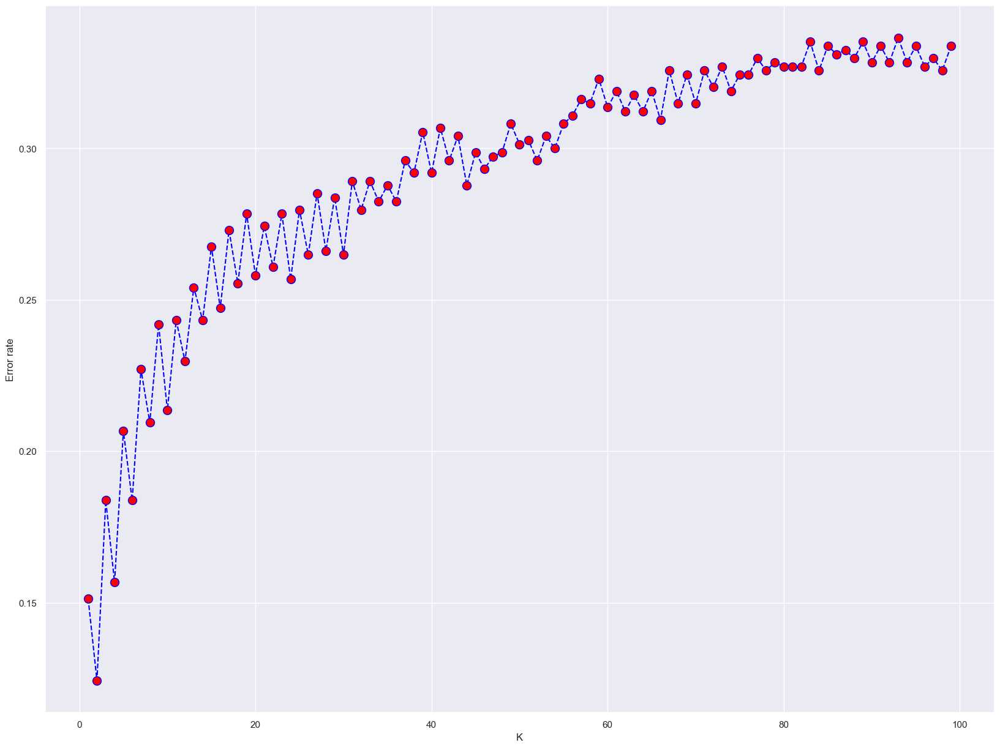

In [1140]:
plt.figure(figsize=(20,15))
plt.plot(range(1,100),error_rate,color='Blue',linestyle='dashed',marker='o',markersize=10,markerfacecolor='red')
plt.xlabel('K')
plt.ylabel('Error rate')

I think k=5 the model have the less error rate so its better to do not change the value of k as k=5 will yeild the best result.

In [1141]:
rf=RandomForestClassifier()
rf.fit(x_train,y_train)

RandomForestClassifier()

In [1142]:
metric_score(rf,x_train,x_test,y_train,y_test,train=True)
metric_score(rf,x_train,x_test,y_train,y_test,train=False)

====================== Train score=====================
accuracy_score:-100.00%
====================== Test score=====================
accuracy_score:- 93.78%


 classificatio report- 
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       389
           1       0.94      0.93      0.93       351

    accuracy                           0.94       740
   macro avg       0.94      0.94      0.94       740
weighted avg       0.94      0.94      0.94       740



An overfitted model can be seen here with low bias and high variance.

# Cross validation-

In [1143]:
score=cross_val_score(rf,princi_comp,y,cv=10)
print(score)
print(score.mean())

[0.87854251 0.91093117 0.95951417 0.93117409 0.94736842 0.93117409
 0.95934959 0.93902439 0.93089431 0.93902439]
0.9326997136368126


In [1144]:
svc=SVC()
svc.fit(x_train,y_train)

SVC()

In [1145]:
metric_score(svc,x_train,x_test,y_train,y_test,train=True)
metric_score(svc,x_train,x_test,y_train,y_test,train=False)

====================== Train score=====================
accuracy_score:-96.76%
====================== Test score=====================
accuracy_score:- 93.11%


 classificatio report- 
              precision    recall  f1-score   support

           0       0.95      0.92      0.93       389
           1       0.91      0.94      0.93       351

    accuracy                           0.93       740
   macro avg       0.93      0.93      0.93       740
weighted avg       0.93      0.93      0.93       740



A generalised model can be seen here with low bias and low variance.

# Cross validation score-

In [1146]:
score=cross_val_score(svc,princi_comp,y,cv=10)
print(score)
print(score.mean())

[0.87854251 0.89068826 0.94736842 0.951417   0.93927126 0.94331984
 0.94715447 0.92682927 0.92276423 0.91869919]
0.9266054441920936


In [1147]:
gb=GradientBoostingClassifier()
gb.fit(x_train,y_train)

GradientBoostingClassifier()

In [1148]:
metric_score(gb,x_train,x_test,y_train,y_test,train=True)
metric_score(gb,x_train,x_test,y_train,y_test,train=False)

====================== Train score=====================
accuracy_score:-96.81%
====================== Test score=====================
accuracy_score:- 86.62%


 classificatio report- 
              precision    recall  f1-score   support

           0       0.88      0.86      0.87       389
           1       0.85      0.87      0.86       351

    accuracy                           0.87       740
   macro avg       0.87      0.87      0.87       740
weighted avg       0.87      0.87      0.87       740



An overfitted model can be seen here with low bias and high variance.

In [1149]:
score=cross_val_score(gb,princi_comp,y,cv=10)
print(score)
print(score.mean())

[0.82995951 0.82591093 0.91093117 0.87854251 0.91093117 0.90688259
 0.8902439  0.87804878 0.88617886 0.88617886]
0.8803808301240907


In [1150]:
dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)

DecisionTreeClassifier()

In [1151]:
metric_score(dt,x_train,x_test,y_train,y_test,train=True)
metric_score(dt,x_train,x_test,y_train,y_test,train=False)

====================== Train score=====================
accuracy_score:-100.00%
====================== Test score=====================
accuracy_score:- 78.24%


 classificatio report- 
              precision    recall  f1-score   support

           0       0.84      0.73      0.78       389
           1       0.74      0.84      0.79       351

    accuracy                           0.78       740
   macro avg       0.79      0.79      0.78       740
weighted avg       0.79      0.78      0.78       740



An overfitted model can be seen here with low bias and high variance.

In [1152]:
score=cross_val_score(dt,princi_comp,y,cv=10)
print(score)
print(score.mean())

[0.77327935 0.81781377 0.83805668 0.86639676 0.78947368 0.82995951
 0.84146341 0.81707317 0.83333333 0.82926829]
0.8236117968467134


In [1153]:
ab=AdaBoostClassifier()
ab.fit(x_train,y_train)

AdaBoostClassifier()

In [1154]:
metric_score(ab,x_train,x_test,y_train,y_test,train=True)
metric_score(ab,x_train,x_test,y_train,y_test,train=False)

====================== Train score=====================
accuracy_score:-88.18%
====================== Test score=====================
accuracy_score:- 82.03%


 classificatio report- 
              precision    recall  f1-score   support

           0       0.83      0.83      0.83       389
           1       0.81      0.81      0.81       351

    accuracy                           0.82       740
   macro avg       0.82      0.82      0.82       740
weighted avg       0.82      0.82      0.82       740



An underfitted model can be seen here with high bias and high variance.

In [1155]:
score=cross_val_score(ad,princi_comp,y,cv=10)
print(score)
print(score.mean())

[0.74493927 0.76923077 0.8340081  0.83805668 0.84210526 0.83805668
 0.84146341 0.82113821 0.86178862 0.84146341]
0.8232250419670188


In [1156]:
bc=BaggingClassifier()
bc.fit(x_train,y_train)

BaggingClassifier()

In [1157]:
metric_score(bc,x_train,x_test,y_train,y_test,train=True)
metric_score(bc,x_train,x_test,y_train,y_test,train=False)

====================== Train score=====================
accuracy_score:-99.65%
====================== Test score=====================
accuracy_score:- 86.76%


 classificatio report- 
              precision    recall  f1-score   support

           0       0.87      0.87      0.87       389
           1       0.86      0.86      0.86       351

    accuracy                           0.87       740
   macro avg       0.87      0.87      0.87       740
weighted avg       0.87      0.87      0.87       740



an underfitted model can be seen here with low bias and high variance.

In [1158]:
score=cross_val_score(bc,princi_comp,y,cv=10)
print(score)
print(score.mean())

[0.88663968 0.86234818 0.92712551 0.89878543 0.88259109 0.90283401
 0.90243902 0.8902439  0.89430894 0.91056911]
0.8957884862249431


In [1159]:
from xgboost import XGBClassifier

In [1160]:
xg=XGBClassifier()
xg.fit(x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [1161]:
metric_score(xg,x_train,x_test,y_train,y_test,train=True)
metric_score(xg,x_train,x_test,y_train,y_test,train=False)

====================== Train score=====================
accuracy_score:-100.00%
====================== Test score=====================
accuracy_score:- 91.22%


 classificatio report- 
              precision    recall  f1-score   support

           0       0.93      0.90      0.92       389
           1       0.90      0.92      0.91       351

    accuracy                           0.91       740
   macro avg       0.91      0.91      0.91       740
weighted avg       0.91      0.91      0.91       740



An underfitted model can be seen here with low bias and high variance.

In [1163]:
score=cross_val_score(xg,princi_comp,y,cv=10)
print(score)
print(score.mean())

[0.88259109 0.91093117 0.95951417 0.91093117 0.95951417 0.94331984
 0.94715447 0.93495935 0.94308943 0.93495935]
0.9326964221059215


In [1164]:
et=ExtraTreesClassifier()
et.fit(x_train,y_train)

ExtraTreesClassifier()

In [1165]:
metric_score(et,x_train,x_test,y_train,y_test,train=True)
metric_score(et,x_train,x_test,y_train,y_test,train=False)

====================== Train score=====================
accuracy_score:-100.00%
====================== Test score=====================
accuracy_score:- 94.86%


 classificatio report- 
              precision    recall  f1-score   support

           0       0.96      0.95      0.95       389
           1       0.94      0.95      0.95       351

    accuracy                           0.95       740
   macro avg       0.95      0.95      0.95       740
weighted avg       0.95      0.95      0.95       740



An underfitted model can be seen with low bias and high variance.

In [1166]:
score=cross_val_score(et,princi_comp,y,cv=10)
print(score)
print(score.mean())

[0.94331984 0.95546559 0.98785425 0.95951417 0.98380567 0.98380567
 0.9796748  0.96341463 0.96747967 0.97560976]
0.9699944043974853


# Selection of best model-

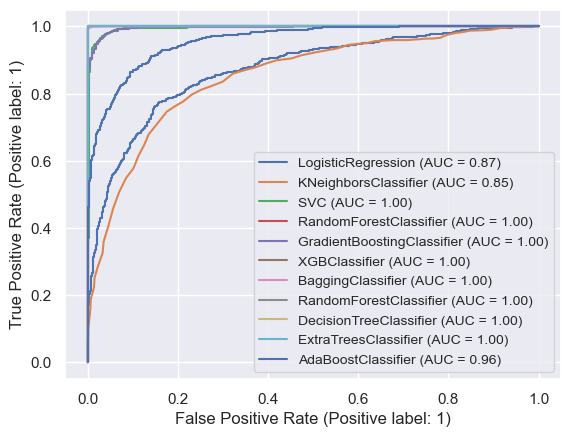

In [1167]:
x=plot_roc_curve(lr,x_train,y_train)
                 
plot_roc_curve(knn,x_train,y_train,ax=x.ax_)

plot_roc_curve(svc,x_train,y_train,ax=x.ax_)
                 
plot_roc_curve(rf,x_train,y_train,ax=x.ax_)                 

plot_roc_curve(gb,x_train,y_train,ax=x.ax_)
                 
plot_roc_curve(xg,x_train,y_train,ax=x.ax_)
                 
plot_roc_curve(bc,x_train,y_train,ax=x.ax_)
                 
plot_roc_curve(rf,x_train,y_train,ax=x.ax_)
                 
plot_roc_curve(dt,x_train,y_train,ax=x.ax_)    
                 
plot_roc_curve(et,x_train,y_train,ax=x.ax_)        
                 
plot_roc_curve(ab,x_train,y_train,ax=x.ax_)   

plt.legend(prop={'size':10}, loc='lower right')
plt.show()

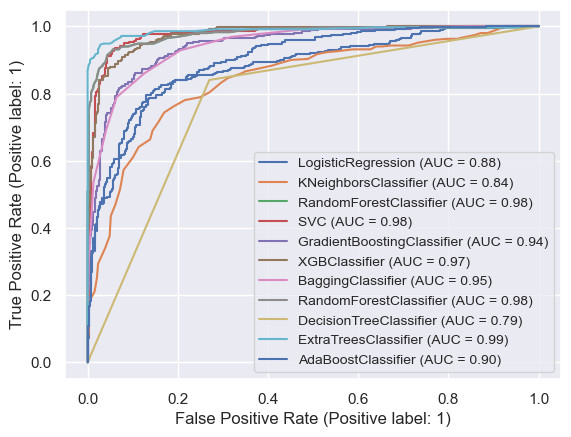

In [1168]:
x=plot_roc_curve(lr,x_test,y_test)
                 
plot_roc_curve(knn,x_test,y_test,ax=x.ax_)
                 
plot_roc_curve(rf,x_test,y_test,ax=x.ax_) 

plot_roc_curve(svc,x_test,y_test,ax=x.ax_)

plot_roc_curve(gb,x_test,y_test,ax=x.ax_)
                 
plot_roc_curve(xg,x_test,y_test,ax=x.ax_)
                 
plot_roc_curve(bc,x_test,y_test,ax=x.ax_)
                 
plot_roc_curve(rf,x_test,y_test,ax=x.ax_)
                 
plot_roc_curve(dt,x_test,y_test,ax=x.ax_)    
                 
plot_roc_curve(et,x_test,y_test,ax=x.ax_)        
                 
plot_roc_curve(ab,x_test,y_test,ax=x.ax_)   

plt.legend(prop={'size':10}, loc='lower right')
plt.show()

# Conclusion- 

Here i am selecting SVC as my best model which is performing best for this data set & looking like a generalised model with low bias and low variance.

# Hyperparameter tunning-

In [1169]:
from sklearn.model_selection import GridSearchCV

In [1170]:
svc.get_params().keys()

dict_keys(['C', 'break_ties', 'cache_size', 'class_weight', 'coef0', 'decision_function_shape', 'degree', 'gamma', 'kernel', 'max_iter', 'probability', 'random_state', 'shrinking', 'tol', 'verbose'])

In [1171]:
param_grid={'kernel' : ['linear', 'poly', 'rbf', 'sigmoid'],'C': [1, 10, 100, 500,1000],'gamma': [0.001, 0.01,.1],'class_weight':['balanced', None]}

In [1172]:
gs=GridSearchCV(svc,param_grid,cv=10)

In [1173]:
gs.fit(x_train,y_train)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid={'C': [1, 10, 100, 500, 1000],
                         'class_weight': ['balanced', None],
                         'gamma': [0.001, 0.01, 0.1],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']})

In [1174]:
gs.best_params_

{'C': 10, 'class_weight': 'balanced', 'gamma': 0.1, 'kernel': 'rbf'}

In [1175]:
final_model=SVC(C=10,class_weight='balanced',gamma=0.1,kernel='rbf')

In [1176]:
final_model.fit(x_train,y_train)
pred=final_model.predict(x_test)
accuracy_score(y_test,pred)

0.9783783783783784

Here we can see that SVC model accuracy increased to almost 98% from 93% with the help of hyperparameter tunning.

# Saving model-

In [1177]:
import joblib

In [1178]:
joblib.dump(final_model,'HR-attrition-model-2')

['HR-attrition-model-2']

In [1179]:
model=joblib.load('HR-attrition-model-2')

In [1180]:
pred=model.predict(x_test)
pred

array([1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1,
       0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0,
       0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1,
       0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1,
       0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1,
       0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1,
       1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1,

In [1182]:
actual=np.array(y_test)
prediction=pred
df1=pd.DataFrame()
df1['Actual']=actual
df1['prediction']=pred
df1

,Actual,prediction
0,1,1
1,0,0
2,0,0
3,1,1
4,0,0
...,...,...
735,0,0
736,1,1
737,0,0
738,0,0


# Plotting ROC Curve-

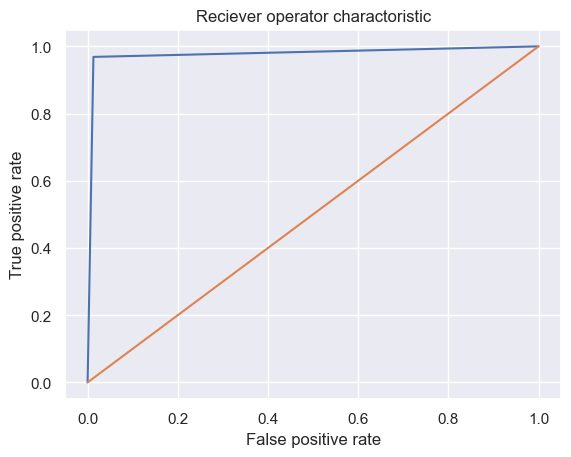

In [1186]:
fpr,tpr,threshold=roc_curve(y_test,final_model.predict(x_test))


plt.figure()
plt.plot(fpr,tpr)
plt.plot([0,1],[0,1])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Reciever operator charactoristic')
plt.show()

# Roc_auc_score-

In [1187]:
roc_auc_score(y_test,pred)

0.9779037491119753

So here we can see that the area under the curve is 98% which is a very good score representing how good our model has performed or understood the variance in the dataset.

# Model-III (Feature selection with Select K best features)

In [1242]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,...,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,EducationField_0,EducationField_1,EducationField_2,JobRole_0,JobRole_1,JobRole_2,JobRole_3
0,41,1,2,1102,2,1.000000,2,2,0,94,...,4,0,5,0,0,1,0,0,0,1
1,49,0,1,279,1,2.000000,1,3,1,61,...,7,1,7,0,0,1,0,0,1,0
2,37,1,2,1373,1,1.259921,2,4,1,92,...,0,0,0,0,1,0,0,0,1,1
3,33,0,1,1392,1,1.442250,4,4,0,56,...,7,3,0,0,0,1,0,0,1,0
4,27,0,2,591,1,1.259921,1,1,1,40,...,2,2,2,0,1,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1,884,1,2.843867,2,3,1,41,...,2,0,3,0,1,1,0,0,1,1
1466,39,0,2,613,1,1.817121,1,4,1,42,...,7,1,7,0,1,1,0,1,0,1
1467,27,0,2,155,1,1.587401,3,2,1,87,...,2,0,3,0,0,1,0,1,0,0
1468,49,0,1,1023,2,1.259921,3,4,1,63,...,6,0,8,0,1,1,0,0,0,1


In [1243]:
x=df.drop(columns=['Attrition'])
y=df.Attrition

In [1244]:
from sklearn.feature_selection import SelectKBest,f_classif

In [1245]:
best_features=SelectKBest(score_func=f_classif,k=30)
bf=best_features.fit(x,y)
df_score=pd.DataFrame(bf.scores_,columns=['score'])
df_score['features']=np.array(x.columns)

In [1246]:
x=df_score.nlargest(15,'score')
x

,score,features
16,94.656457,OverTime
21,74.904607,TotalWorkingYears
24,55.492363,YearsAtCompany
13,52.166686,MonthlyIncome
10,43.215344,JobLevel
12,39.599763,MaritalStatus
25,38.838303,YearsInCurrentRole
0,38.175887,Age
27,36.712311,YearsWithCurrManager
20,28.140501,StockOptionLevel


In [1247]:
lis=x.features.to_list()
lis

['OverTime',
 'TotalWorkingYears',
 'YearsAtCompany',
 'MonthlyIncome',
 'JobLevel',
 'MaritalStatus',
 'YearsInCurrentRole',
 'Age',
 'YearsWithCurrManager',
 'StockOptionLevel',
 'JobRole_3',
 'JobInvolvement',
 'JobRole_2',
 'JobSatisfaction',
 'EnvironmentSatisfaction']

In [1248]:
df1=df[lis]
df1

,OverTime,TotalWorkingYears,YearsAtCompany,MonthlyIncome,JobLevel,MaritalStatus,YearsInCurrentRole,Age,YearsWithCurrManager,StockOptionLevel,JobRole_3,JobInvolvement,JobRole_2,JobSatisfaction,EnvironmentSatisfaction
0,1,2.000000,1.817121,18.164137,2,2,4,41,5,0,1,3,0,4,2
1,0,2.154435,2.154435,17.246691,2,1,7,49,7,1,0,2,1,2,3
2,1,1.912931,0.000000,12.785433,1,2,0,37,0,0,1,2,1,3,4
3,1,2.000000,2.000000,14.275168,1,1,7,33,0,0,0,3,1,3,4
4,0,1.817121,1.259921,15.136531,1,1,2,27,2,1,1,3,1,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,2.571282,1.709976,13.699373,2,1,2,36,3,1,1,4,1,4,3
1466,0,2.080084,1.912931,21.537882,3,1,7,39,7,1,1,2,0,1,4
1467,1,1.817121,1.817121,18.313440,2,1,2,27,3,1,0,4,0,2,2
1468,0,2.571282,2.080084,17.533270,2,1,6,49,8,0,1,2,0,2,4


In [1249]:
df1['Attrition']=np.array(df['Attrition'])

In [1250]:
df1

,OverTime,TotalWorkingYears,YearsAtCompany,MonthlyIncome,JobLevel,MaritalStatus,YearsInCurrentRole,Age,YearsWithCurrManager,StockOptionLevel,JobRole_3,JobInvolvement,JobRole_2,JobSatisfaction,EnvironmentSatisfaction,Attrition
0,1,2.000000,1.817121,18.164137,2,2,4,41,5,0,1,3,0,4,2,1
1,0,2.154435,2.154435,17.246691,2,1,7,49,7,1,0,2,1,2,3,0
2,1,1.912931,0.000000,12.785433,1,2,0,37,0,0,1,2,1,3,4,1
3,1,2.000000,2.000000,14.275168,1,1,7,33,0,0,0,3,1,3,4,0
4,0,1.817121,1.259921,15.136531,1,1,2,27,2,1,1,3,1,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,2.571282,1.709976,13.699373,2,1,2,36,3,1,1,4,1,4,3,0
1466,0,2.080084,1.912931,21.537882,3,1,7,39,7,1,1,2,0,1,4,0
1467,1,1.817121,1.817121,18.313440,2,1,2,27,3,1,0,4,0,2,2,0
1468,0,2.571282,2.080084,17.533270,2,1,6,49,8,0,1,2,0,2,4,0


# Separating x & y-

In [1251]:
x=df1.drop(columns=['Attrition'],axis=1)
y=df1.Attrition

In [1252]:
from sklearn.preprocessing import StandardScaler

In [1253]:
scaler=StandardScaler()
x_scaled=scaler.fit_transform(x)
x_scaled=pd.DataFrame(x_scaled,columns=x.columns)

In [1254]:
x_scaled

,OverTime,TotalWorkingYears,YearsAtCompany,MonthlyIncome,JobLevel,MaritalStatus,YearsInCurrentRole,Age,YearsWithCurrManager,StockOptionLevel,JobRole_3,JobInvolvement,JobRole_2,JobSatisfaction,EnvironmentSatisfaction
0,1.591746,-0.204222,0.127705,0.104716,-0.057788,1.236820,-0.063296,0.446350,0.245834,-0.932014,0.852865,0.379672,-1.001361,1.153254,-0.660531
1,-0.628241,0.076388,0.703698,-0.121486,-0.057788,-0.133282,0.764998,1.322365,0.806541,0.241988,-1.172518,-1.026167,0.998640,-0.660853,0.254625
2,1.591746,-0.362426,-2.975183,-1.221441,-0.961486,1.236820,-1.167687,0.008343,-1.155935,-0.932014,0.852865,-1.026167,0.998640,0.246200,1.169781
3,1.591746,-0.204222,0.439987,-0.854136,-0.961486,-0.133282,0.764998,-0.429664,-1.155935,-0.932014,-1.172518,0.379672,0.998640,0.246200,1.169781
4,-0.628241,-0.536515,-0.823761,-0.641761,-0.961486,-0.133282,-0.615492,-1.086676,-0.595227,0.241988,0.852865,0.379672,0.998640,-0.660853,-1.575686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-0.628241,0.833802,-0.055254,-0.996103,-0.057788,-0.133282,-0.615492,-0.101159,-0.314873,0.241988,0.852865,1.785511,0.998640,1.153254,0.254625
1466,-0.628241,-0.058709,0.291310,0.936537,0.845911,-0.133282,0.764998,0.227347,0.806541,0.241988,0.852865,-1.026167,-1.001361,-1.567907,1.169781
1467,1.591746,-0.536515,0.127705,0.141528,-0.057788,-0.133282,-0.615492,-1.086676,-0.314873,0.241988,-1.172518,1.785511,-1.001361,-0.660853,-0.660531
1468,-0.628241,0.833802,0.576737,-0.050828,-0.057788,-0.133282,0.488900,1.322365,1.086895,-0.932014,0.852865,-1.026167,-1.001361,-0.660853,1.169781


In [1255]:
y

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1470, dtype: int32

In [1256]:
maxacc=0
maxrs=0

for i in range(1000):
    x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.30,random_state=i)
    lr=LogisticRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=accuracy_score(y_test,pred)
    
    if acc>maxacc:
        maxacc=acc
        maxrs=i
print('the best accuracy of the model is {} and best random state is {}'.format(maxacc,maxrs) )        

the best accuracy of the model is 0.9138321995464853 and best random state is 123


In [1257]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.30,random_state=123)

In [1258]:
def metric_score(clf,x_train,x_test,y_train,y_test,train=True):
    if train:
        pred=clf.predict(x_train)
        print('==========================Train result=========================')
        print(f'Accuracy score is- {accuracy_score(y_train,pred)*100:.2f}%')
        
        
    if train==False:
        y_pred=clf.predict(x_test)
        print('==========================Test result=========================')
        print(f'Accuracy score is-{accuracy_score(y_test,y_pred)*100:.2f}%')
        print('\n\nclassification report-\n',classification_report(y_test,y_pred))       

In [1259]:
lr=LogisticRegression()
lr.fit(x_train,y_train)

LogisticRegression()

In [1260]:
metric_score(lr,x_train,x_test,y_train,y_test,train=True)
metric_score(lr,x_train,x_test,y_train,y_test,train=False)

==========================Train result=========================
Accuracy score is- 84.84%
==========================Test result=========================
Accuracy score is-91.38%


classification report-
               precision    recall  f1-score   support

           0       0.92      0.99      0.95       384
           1       0.88      0.39      0.54        57

    accuracy                           0.91       441
   macro avg       0.90      0.69      0.74       441
weighted avg       0.91      0.91      0.90       441



an underfitted model can be seen here with logistic regression.

# Cross validation score-

In [1261]:
score=cross_val_score(lr,x,y,cv=10)
print(score)
print(score.mean())

[0.89795918 0.85034014 0.85034014 0.8707483  0.86394558 0.85034014
 0.85034014 0.85714286 0.88435374 0.84353741]
0.8619047619047618


In [1262]:
sv=SVC()
sv.fit(x_train,y_train)

SVC()

In [1263]:
metric_score(sv,x_train,x_test,y_train,y_test,train=True)
metric_score(sv,x_train,x_test,y_train,y_test,train=False)

==========================Train result=========================
Accuracy score is- 87.07%
==========================Test result=========================
Accuracy score is-89.34%


classification report-
               precision    recall  f1-score   support

           0       0.90      0.99      0.94       384
           1       0.78      0.25      0.37        57

    accuracy                           0.89       441
   macro avg       0.84      0.62      0.66       441
weighted avg       0.88      0.89      0.87       441



The support vector classifier model looks like an underfitted model with high bias and high variance.

# Cross validation score-

In [1264]:
score=cross_val_score(sv,x,y,cv=10)
print(score)
print(score.mean())

[0.83673469 0.83673469 0.83673469 0.83673469 0.83673469 0.83673469
 0.83673469 0.84353741 0.84353741 0.84353741]
0.8387755102040817


In [1265]:
knn=KNeighborsClassifier()
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [1266]:
metric_score(knn,x_train,x_test,y_train,y_test,train=True)
metric_score(knn,x_train,x_test,y_train,y_test,train=False)

==========================Train result=========================
Accuracy score is- 87.37%
==========================Test result=========================
Accuracy score is-87.30%


classification report-
               precision    recall  f1-score   support

           0       0.89      0.97      0.93       384
           1       0.52      0.23      0.32        57

    accuracy                           0.87       441
   macro avg       0.71      0.60      0.62       441
weighted avg       0.85      0.87      0.85       441



KNN classifier model looks like an underfitted model with high bias and high variance.

# Cross validation score-

In [1267]:
score=cross_val_score(knn,x,y,cv=10)
print(score)
print(score.mean())

[0.80272109 0.80952381 0.83673469 0.82993197 0.86394558 0.85034014
 0.78911565 0.82312925 0.85034014 0.8707483 ]
0.8326530612244898


In [1268]:
rf=RandomForestClassifier()
rf.fit(x_train,y_train)

RandomForestClassifier()

In [1269]:
metric_score(rf,x_train,x_test,y_train,y_test,train=True)
metric_score(rf,x_train,x_test,y_train,y_test,train=False)

==========================Train result=========================
Accuracy score is- 100.00%
==========================Test result=========================
Accuracy score is-89.12%


classification report-
               precision    recall  f1-score   support

           0       0.90      0.98      0.94       384
           1       0.70      0.28      0.40        57

    accuracy                           0.89       441
   macro avg       0.80      0.63      0.67       441
weighted avg       0.88      0.89      0.87       441



A clear overfitting can be seen here with random forest model.

# Cross validation score-

In [1270]:
score=cross_val_score(rf,x,y,cv=10)
print(score)
print(score.mean())

[0.86394558 0.85714286 0.89115646 0.86394558 0.89115646 0.83673469
 0.82993197 0.8707483  0.88435374 0.85034014]
0.8639455782312926


In [1271]:
gb=GradientBoostingClassifier()
gb.fit(x_train,y_train)

GradientBoostingClassifier()

In [1272]:
metric_score(gb,x_train,x_test,y_train,y_test, train=True)
metric_score(gb,x_train,x_test,y_train,y_test, train=False)

==========================Train result=========================
Accuracy score is- 92.03%
==========================Test result=========================
Accuracy score is-89.80%


classification report-
               precision    recall  f1-score   support

           0       0.92      0.97      0.94       384
           1       0.68      0.40      0.51        57

    accuracy                           0.90       441
   macro avg       0.80      0.69      0.72       441
weighted avg       0.89      0.90      0.89       441



A generalised model can be seen here with low bias and low variance.

# Cross validation score-

In [1273]:
score=cross_val_score(gb,x,y,cv=10)
print(score)
print(score.mean())

[0.89115646 0.85714286 0.86394558 0.86394558 0.89795918 0.85714286
 0.82993197 0.85714286 0.8707483  0.8707483 ]
0.865986394557823


In [1274]:
ab=AdaBoostClassifier()
ab.fit(x_train,y_train)

AdaBoostClassifier()

In [1275]:
metric_score(ab,x_train,x_test,y_train,y_test, train=True)
metric_score(ab,x_train,x_test,y_train,y_test, train=False)

==========================Train result=========================
Accuracy score is- 88.53%
==========================Test result=========================
Accuracy score is-88.89%


classification report-
               precision    recall  f1-score   support

           0       0.92      0.96      0.94       384
           1       0.60      0.42      0.49        57

    accuracy                           0.89       441
   macro avg       0.76      0.69      0.72       441
weighted avg       0.88      0.89      0.88       441



Looks like an normal model with not so high test score.

# Cross validation score-

In [1276]:
score=cross_val_score(ab,x,y,cv=10)
print(score)
print(score.mean())

[0.91836735 0.85714286 0.87755102 0.84353741 0.8707483  0.85714286
 0.83673469 0.84353741 0.89795918 0.87755102]
0.8680272108843538


In [1277]:
bc=BaggingClassifier()
bc.fit(x_train,y_train)

BaggingClassifier()

In [1278]:
metric_score(bc,x_train,x_test,y_train,y_test, train=True)
metric_score(bc,x_train,x_test,y_train,y_test, train=False)

==========================Train result=========================
Accuracy score is- 97.67%
==========================Test result=========================
Accuracy score is-87.53%


classification report-
               precision    recall  f1-score   support

           0       0.91      0.95      0.93       384
           1       0.53      0.37      0.43        57

    accuracy                           0.88       441
   macro avg       0.72      0.66      0.68       441
weighted avg       0.86      0.88      0.87       441



An overfitted model can be seen here with low bias and high variance.

In [1279]:
score=cross_val_score(bc,x,y,cv=10)
print(score)
print(score.mean())

[0.86394558 0.82312925 0.86394558 0.84353741 0.84353741 0.85714286
 0.82312925 0.84353741 0.86394558 0.84353741]
0.846938775510204


In [1280]:
et=ExtraTreesClassifier()
et.fit(x_train,y_train)

ExtraTreesClassifier()

In [1281]:
metric_score(et,x_train,x_test,y_train,y_test, train=True)
metric_score(et,x_train,x_test,y_train,y_test, train=False)

==========================Train result=========================
Accuracy score is- 100.00%
==========================Test result=========================
Accuracy score is-88.44%


classification report-
               precision    recall  f1-score   support

           0       0.90      0.97      0.94       384
           1       0.62      0.28      0.39        57

    accuracy                           0.88       441
   macro avg       0.76      0.63      0.66       441
weighted avg       0.86      0.88      0.87       441



An overfitted model can be seen here with low bias and high variance.

# Cross validation score-

In [1282]:
score=cross_val_score(et,x,y,cv=10)
print(score)
print(score.mean())

[0.83673469 0.86394558 0.86394558 0.83673469 0.8707483  0.85714286
 0.82993197 0.85714286 0.87755102 0.85034014]
0.8544217687074831


In [1283]:
dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)

DecisionTreeClassifier()

In [1284]:
metric_score(dt,x_train,x_test,y_train,y_test, train=True)
metric_score(dt,x_train,x_test,y_train,y_test, train=False)

==========================Train result=========================
Accuracy score is- 100.00%
==========================Test result=========================
Accuracy score is-80.05%


classification report-
               precision    recall  f1-score   support

           0       0.92      0.84      0.88       384
           1       0.33      0.51      0.40        57

    accuracy                           0.80       441
   macro avg       0.62      0.68      0.64       441
weighted avg       0.84      0.80      0.82       441



An overfitted model can be seen here with low bias and high variance.

In [1285]:
score=cross_val_score(dt,x,y,cv=10)
print(score)
print(score.mean())

[0.80272109 0.80952381 0.80952381 0.78911565 0.82993197 0.79591837
 0.76870748 0.79591837 0.81632653 0.78231293]
0.8


In [1286]:
from xgboost import XGBClassifier

In [1287]:
xg=XGBClassifier()
xg.fit(x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [1288]:
metric_score(dt,x_train,x_test,y_train,y_test, train=True)
metric_score(dt,x_train,x_test,y_train,y_test, train=False)

==========================Train result=========================
Accuracy score is- 100.00%
==========================Test result=========================
Accuracy score is-80.05%


classification report-
               precision    recall  f1-score   support

           0       0.92      0.84      0.88       384
           1       0.33      0.51      0.40        57

    accuracy                           0.80       441
   macro avg       0.62      0.68      0.64       441
weighted avg       0.84      0.80      0.82       441



An overfitted model can be seen here with low bias and high variance.

# Selection of best model-

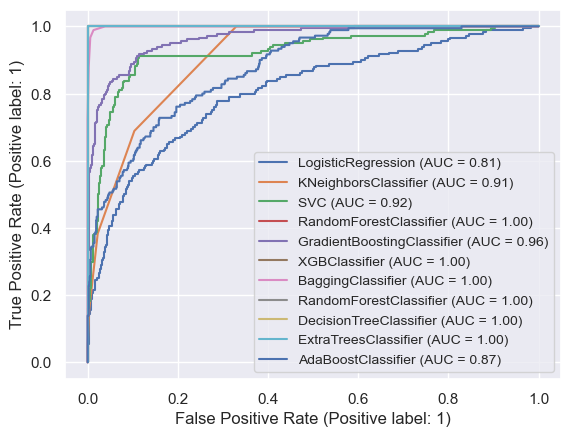

In [1289]:
x=plot_roc_curve(lr,x_train,y_train)
                 
plot_roc_curve(knn,x_train,y_train,ax=x.ax_)

plot_roc_curve(sv,x_train,y_train,ax=x.ax_)
                 
plot_roc_curve(rf,x_train,y_train,ax=x.ax_)                 

plot_roc_curve(gb,x_train,y_train,ax=x.ax_)
                 
plot_roc_curve(xg,x_train,y_train,ax=x.ax_)
                 
plot_roc_curve(bc,x_train,y_train,ax=x.ax_)
                 
plot_roc_curve(rf,x_train,y_train,ax=x.ax_)
                 
plot_roc_curve(dt,x_train,y_train,ax=x.ax_)    
                 
plot_roc_curve(et,x_train,y_train,ax=x.ax_)        
                 
plot_roc_curve(ab,x_train,y_train,ax=x.ax_)   

plt.legend(prop={'size':10}, loc='lower right')
plt.show()

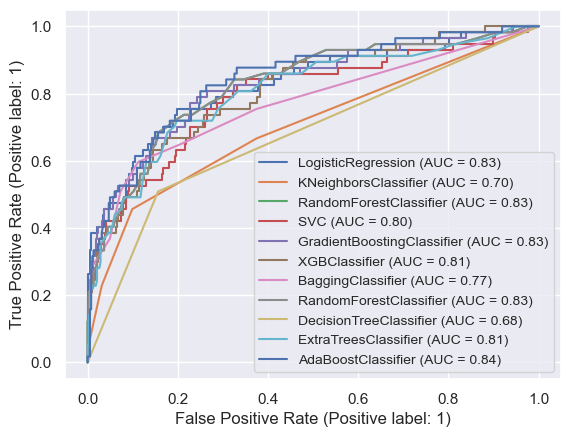

In [1290]:
x=plot_roc_curve(lr,x_test,y_test)
                 
plot_roc_curve(knn,x_test,y_test,ax=x.ax_)
                 
plot_roc_curve(rf,x_test,y_test,ax=x.ax_) 

plot_roc_curve(sv,x_test,y_test,ax=x.ax_)

plot_roc_curve(gb,x_test,y_test,ax=x.ax_)
                 
plot_roc_curve(xg,x_test,y_test,ax=x.ax_)
                 
plot_roc_curve(bc,x_test,y_test,ax=x.ax_)
                 
plot_roc_curve(rf,x_test,y_test,ax=x.ax_)
                 
plot_roc_curve(dt,x_test,y_test,ax=x.ax_)    
                 
plot_roc_curve(et,x_test,y_test,ax=x.ax_)        
                 
plot_roc_curve(ab,x_test,y_test,ax=x.ax_)   

plt.legend(prop={'size':10}, loc='lower right')
plt.show()

Here we have selected Gradient boosting classifier as best fit model on this dataset which is giving us much stablised generalised model.

# Hyperparameter tunning-

In [1323]:
from sklearn.model_selection import GridSearchCV

In [1373]:
param_grid={'loss':['log_loss', 'exponential'],'learning_rate':[.1,.001,.01,1],'n_estimators':[100,200,300,400],'criterion':['friedman_mse', 'squared_error'],'min_samples_split':[3,4,5],'min_samples_leaf':[2,4,],'max_depth':[2,4,6,8],'random_state':[100,200,300],'max_leaf_nodes':[2,3,4]}

In [1374]:
gs=GridSearchCV(GradientBoostingClassifier(),param_grid,cv=5)

In [1375]:
ad.get_params().keys()

dict_keys(['algorithm', 'base_estimator', 'learning_rate', 'n_estimators', 'random_state'])

In [1376]:
gs.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(),
             param_grid={'criterion': ['friedman_mse', 'squared_error'],
                         'learning_rate': [0.1, 0.001, 0.01, 1],
                         'loss': ['log_loss', 'exponential'],
                         'max_depth': [2, 4, 6, 8], 'max_leaf_nodes': [2, 3, 4],
                         'min_samples_leaf': [2, 4],
                         'min_samples_split': [3, 4, 5],
                         'n_estimators': [100, 200, 300, 400],
                         'random_state': [100, 200, 300]})

In [1377]:
gs.best_params_

{'criterion': 'friedman_mse',
 'learning_rate': 0.1,
 'loss': 'exponential',
 'max_depth': 2,
 'max_leaf_nodes': 2,
 'min_samples_leaf': 4,
 'min_samples_split': 3,
 'n_estimators': 400,
 'random_state': 100}

In [1378]:
final_model=GradientBoostingClassifier(criterion= 'friedman_mse',
 learning_rate= 0.1,
 loss= 'exponential',
 max_depth=2,
 max_leaf_nodes= 2,
 min_samples_leaf= 4,
 min_samples_split= 3,
 n_estimators= 400,
 random_state= 100)

In [1379]:
final_model.fit(x_train,y_train)
pred=final_model.predict(x_test)
accuracy_score(y_test,pred)

0.9047619047619048

# Saving model-

In [1381]:
import joblib

In [1382]:
joblib.dump(final_model,'hr attrition Model-3')

['hr attrition Model-3']

In [1383]:
model=joblib.load('hr attrition Model-3')

In [1384]:
prediction=model.predict(x_test)

In [1385]:
df=pd.DataFrame()
df['Prediction']=np.array(prediction)
df['Actual']=np.array(y_test)
df

,Prediction,Actual
0,1,1
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
436,0,0
437,0,0
438,1,1
439,0,0


# Plotting AUC & ROC curve-

In [1386]:
from sklearn.metrics import roc_auc_score,auc,roc_curve

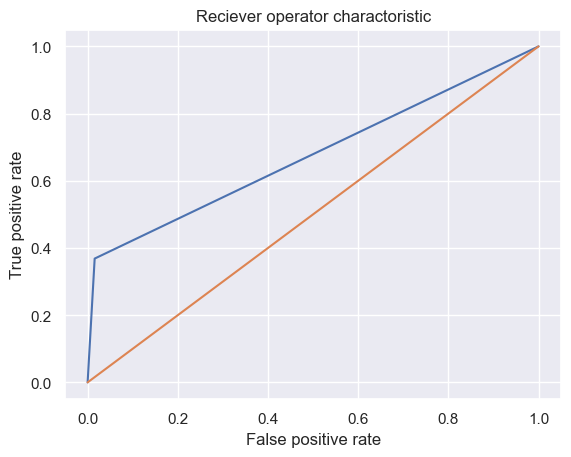

0.6763980263157895


In [1387]:
fpr,tpr,threshold=roc_curve(y_test,model.predict(x_test))
roc_auc=auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr)
plt.plot([0,1],[0,1])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Reciever operator charactoristic')
plt.show()

auc_score=roc_auc_score(y_test,final_model.predict(x_test))
print(auc_score)

Here we got area under the curve is 68%.